# Post Reionization Quenching

Here we look into the histories of halos that quenched far before infall, and just after reionization. 

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import pickle
import pynbody
pynbody.config['halo-class-priority'] =  [pynbody.halo.ahf.AHFCatalogue,
                                          pynbody.halo.GrpCatalogue,
                                          pynbody.halo.AmigaGrpCatalogue,
                                          pynbody.halo.legacy.RockstarIntermediateCatalogue,
                                          pynbody.halo.rockstar.RockstarCatalogue,
                                          pynbody.halo.subfind.SubfindCatalogue, pynbody.halo.hop.HOPCatalogue]

%matplotlib inline
print(mpl.get_backend())
mpl.rc('font',**{'family':'serif','monospace':['Palatino']})
mpl.rc('text', usetex=True)
mpl.rcParams.update({'font.size': 9})

module://ipykernel.pylab.backend_inline


In [382]:
def read_file(name, halo_num):
    data = []
    with open('/home/akinshol/Data/Timescales/DataFiles/'+name+'.data','rb') as f:
        while True:
            try: 
                data.append(pickle.load(f))
            except EOFError:
                break
    data = pd.DataFrame(data)
    
    if not halo_num=='all':
        data = data[data.z0haloid == halo_num]

    return data

def cumulative_sfh(name, halo_num):
    age = 13.800797497330507
    if name=='h148':
        s = pynbody.load('/home/christenc/Data/Sims/h148.cosmo50PLK.3072g/h148.cosmo50PLK.3072g3HbwK1BH/snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096')
    else:
        s = pynbody.load('/home/christenc/Data/Sims/'+name+'.cosmo50PLK.3072g/'+name+'.cosmo50PLK.3072gst5HbwK1BH/snapshots/'+name+'.cosmo50PLK.3072gst5HbwK1BH.004096')
    halo = s.halos()[halo_num]
    try:
        sfh, bins = pynbody.plot.stars.sfh(halo, filename=None, massform=False, clear=False, legend=False, subplot=False, trange=False, bins=128)
        plt.clf()
    except ValueError:
        print(f'Cannot create SFH, only {len(halo.s)} star particles')
        raise

    sfhmstar = np.sum(sfh)
    bincenters = 0.5*(bins[1:]+bins[:-1])
    c_sfh = np.empty(shape=sfh.shape)
    for i in range(len(bincenters)):
        c_sfh[i] = np.sum(sfh[:i+1])/sfhmstar 
    return c_sfh, age-bincenters

def age(name, halo_num):
    if name=='h148':
        s = pynbody.load('/home/christenc/Data/Sims/h148.cosmo50PLK.3072g/h148.cosmo50PLK.3072g3HbwK1BH/snapshots/h148.cosmo50PLK.3072g3HbwK1BH.004096')
    else:
        s = pynbody.load('/home/christenc/Data/Sims/'+name+'.cosmo50PLK.3072g/'+name+'.cosmo50PLK.3072gst5HbwK1BH/snapshots/'+name+'.cosmo50PLK.3072gst5HbwK1BH.004096')
    halo = s.halos()[halo_num]
    return np.array(halo.s['age'].in_units('Gyr'),dtype=float)

In [246]:
def CaseStudyPlots(simulation_name,i,showram=True,filename=True):

    data = read_file(simulation_name, i)
    # data[:10]

    age = 13.800797497330507
    q_thresh = 0.9
    i_thresh = 1.0
    
    print('Gathering data...')
    time = age - np.array(data['time'], dtype=float)
    gasfrac = np.array(data['gasfrac'], dtype=float)
    gastemp = np.array(data['gtemp'], dtype=float)
    ratio = np.array(data['ratio'], dtype=float)
    dist = np.array(data['h1dist'], dtype=float)
    SNHf = np.array(data['SNHfrac'], dtype=float)
    fHI = np.array(data['fHI'], dtype=float)
    mvir = np.array(data['mass'], dtype=float)
    HIratio = np.array(data['HIratio'], dtype=float)
    mHI = np.array(data['HIratio'],dtype=float)*np.array(data['mstar'],dtype=float)
    mgas = np.array(data['mgas'],dtype=float)
    c_sfh, bc = cumulative_sfh(simulation_name, i)

    shaded_min = -1
    shaded_max = 500*np.max(mgas)

    fig, ax = plt.subplots(1,1,figsize=(4,4), dpi=100)
    ax.plot(time,dist,'g-')
    ax.invert_xaxis()
    ax.set_xlabel('Lookback Time [Gyr]')
    label3 = ax.set_ylabel(r'Distance from Host [$R_{\mathrm{vir}}$]')
    label3.set_color('g')
    ax.semilogy()
    ax.set_xlim(14,0)
    ax.set_ylim(0.1, 25)

    ax1 = ax.twinx()
    ax1.plot(time,ratio,'m-')
    label4 = ax1.set_ylabel(r'$P_{\mathrm{ram}} / P_{\mathrm{rest}}$')
    label4.set_color('m')
    ax1.set_ylim(np.min(ratio[~np.isnan(ratio)])-0.3, np.max(ratio[~np.isnan(ratio)])+1)
    npeaks = 1
    peak_indices = np.argsort(ratio[~np.isnan(ratio)])[-npeaks:]


    ax.fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for index in peak_indices:
        t = time[~np.isnan(ratio)][index]
        ax.plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)

    if showram:
        plt.show()

    fig, ax = plt.subplots(1,3,figsize=(18,4),dpi=300)
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for i in [0,1,2]:
        for index in peak_indices:
            t = time[~np.isnan(ratio)][index]
            ax[i].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)


    ax[0].plot(bc, c_sfh, 'r-')
    ax[0].invert_xaxis()
    ax[0].set_xlabel('Lookback Time [Gyr]')
    label1 = ax[0].set_ylabel('Cumulative, Normalized SFH')
    label1.set_color('r')
    ax[0].set_ylim(-0.05,1.05)
    ax[0].set_xlim(14,0)

    ax0 = ax[0].twinx()
    ax0.plot(time,HIratio,'b-')
    ax0.set_ylim(-1,3)
    label2 = ax0.set_ylabel(r'$M_{\mathrm{HI}}\ /\ M_{*}$')
    label2.set_color('b')
    t = np.max(bc[c_sfh >= 0.99])

    for i in [0,1,2]:
        ax[i].plot([t,t],[shaded_min,shaded_max], 'r--', linewidth=1)


    ax[1].plot(time,mHI,color='#370ec2',label='HI', linestyle='-')
    ax[1].plot(time,mgas,color='#370ec2',label='All Gas', linestyle='--')
    ax[1].set_xlabel('Lookback Time [Gyr]')
    label = ax[1].set_ylabel(r'Gas Mass [$M_{\odot}$]')
    label.set_color('#370ec2')
    ax[1].legend(frameon=False)
    ax[1].semilogy()
    ax[1].invert_xaxis()
    ax[1].set_xlim(14,0)
    allgas = np.append(mgas,mHI)
    allgas = allgas[(~np.isnan(allgas)) & (allgas!=0)]
    ax[1].set_ylim(0.5*np.min(allgas),1.4*np.max(allgas))

    ax1 = ax[1].twinx()
    ax1.plot(time,gastemp,'k-')
    ax1.invert_xaxis()
    ax1.set_xlabel('Lookback Time [Gyr]')
    ax1.set_ylabel('Mean Gas Temperature [K]')
    ax1.set_xlim(14,0)
    ax1.set_ylim(4000, 40000)

    # ax[2].set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.4*np.max(gastemp[~np.isnan(gastemp)]))
    # ax[2].plot(time,data['outflow_temp_23'],label='Outflow')
    # ax[2].plot(time,data['inflow_temp_23'],label='Inflow')
    # ax[2].legend(frameon=False, prop={'size':9})
    # ax[2].semilogy()


    netflux = data['outflow_91'] + data['inflow_91']
    # ax[2].plot(time, netflux, color='#ad7617', linestyle='-')
    # ax[2].invert_xaxis()
    # label5 = ax[2].set_ylabel(r'Net Gas Flux [$M_{\mathrm{\odot}}\ \mathrm{yr}^{-1}$]')
    # label5.set_color('#ad7617')
    # ax[2].set_ylim(1.2*np.min(netflux),1.2*np.max(netflux))
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min,shaded_max, where=(netflux < 0.), edgecolor='none',alpha=0.2, facecolor='#ad7617')

    ax[2].invert_xaxis()
    ax[2].plot(time,abs(data['outflow_91']), color='r',label='outflow')
    ax[2].plot(time,abs(data['inflow_91']), color='orange', label='inflow')
    ax[2].set_ylabel('Outflow Rate / Inflow Rate')
    ax[2].legend(frameon=False)
    alloutflows = np.append(abs(data['outflow_91']),abs(data['inflow_91']))
    alloutflows = alloutflows[~np.isnan(alloutflows)]

    if (alloutflows == 0.).all():
        ax[2].set_ylim(-0.001,0.001)
    else:
        ax[2].set_ylim(-0.001,1.3*np.max(alloutflows))
    ax[2].set_xlim(14,0)

    ax2 = ax[2].twinx()
    ax2.plot(time,SNHf, c='b')
    label = ax2.set_ylabel('SN Heated Fraction')
    label.set_color('b')


    plt.subplots_adjust(wspace=0.45)
    if filename:
        f = 'case_study_'+str(simulation_name)+'_'+str(i)+'.png'
        plt.savefig('CaseStudyPlots/'+f, dpi=300)
    else:
        plt.savefig('CaseStudyPlots/'+str(filename), dpi=300)
    plt.show()

In [3]:
def CaseStudyPlots(simulation_name,i,showram=True,filename=True):

    data = read_file(simulation_name, i)
    # data[:10]

    age = 13.800797497330507
    q_thresh = 0.9
    i_thresh = 1.0
    
    print('Gathering data...')
    time = age - np.array(data['time'], dtype=float)
    gasfrac = np.array(data['gasfrac'], dtype=float)
    gastemp = np.array(data['gtemp'], dtype=float)
    ratio = np.array(data['ratio'], dtype=float)
    dist = np.array(data['h1dist'], dtype=float)
    SNHf = np.array(data['SNHfrac'], dtype=float)
    fHI = np.array(data['fHI'], dtype=float)
    mvir = np.array(data['mass'], dtype=float)
    HIratio = np.array(data['HIratio'], dtype=float)
    mHI = np.array(data['HIratio'],dtype=float)*np.array(data['mstar'],dtype=float)
    mgas = np.array(data['mgas'],dtype=float)
    c_sfh, bc = cumulative_sfh(simulation_name, i)

    shaded_min = -1
    shaded_max = 500*np.max(mgas)

    fig, ax = plt.subplots(1,1,figsize=(4,4), dpi=100)
    ax.plot(time,dist,'g-')
    ax.invert_xaxis()
    ax.set_xlabel('Lookback Time [Gyr]')
    label3 = ax.set_ylabel(r'Distance from Host [$R_{\mathrm{vir}}$]')
    label3.set_color('g')
    ax.semilogy()
    ax.set_xlim(14,0)
    ax.set_ylim(0.1, 25)

    ax1 = ax.twinx()
    ax1.plot(time,ratio,'m-')
    label4 = ax1.set_ylabel(r'$P_{\mathrm{ram}} / P_{\mathrm{rest}}$')
    label4.set_color('m')
    ax1.set_ylim(np.min(ratio[~np.isnan(ratio)])-0.3, np.max(ratio[~np.isnan(ratio)])+1)
    npeaks = 1
    peak_indices = np.argsort(ratio[~np.isnan(ratio)])[-npeaks:]


    ax.fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for index in peak_indices:
        t = time[~np.isnan(ratio)][index]
        ax.plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)

    if showram:
        plt.show()

    fig, ax = plt.subplots(1,3,figsize=(18,4),dpi=300)
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min, shaded_max, where=(dist < 1), edgecolor='none',alpha=0.2, facecolor='g')

    for i in [0,1,2]:
        for index in peak_indices:
            t = time[~np.isnan(ratio)][index]
            ax[i].plot([t,t],[shaded_min,shaded_max], 'm--', linewidth=1)


    ax[0].plot(bc, c_sfh, 'r-')
    ax[0].invert_xaxis()
    ax[0].set_xlabel('Lookback Time [Gyr]')
    label1 = ax[0].set_ylabel('Cumulative, Normalized SFH')
    label1.set_color('r')
    ax[0].set_ylim(-0.05,1.05)
    ax[0].set_xlim(14,0)

    ax0 = ax[0].twinx()
    ax0.plot(time,HIratio,'b-')
    ax0.set_ylim(-1,10)
    label2 = ax0.set_ylabel(r'$M_{\mathrm{HI}}\ /\ M_{*}$')
    label2.set_color('b')
    t = np.max(bc[c_sfh >= 0.99])

    for i in [0,1,2]:
        ax[i].plot([t,t],[shaded_min,shaded_max], 'r--', linewidth=1)


    ax[1].plot(time,mHI,color='#370ec2',label='HI', linestyle='-')
    ax[1].plot(time,mgas,color='#370ec2',label='All Gas', linestyle='--')
    ax[1].set_xlabel('Lookback Time [Gyr]')
    label = ax[1].set_ylabel(r'Gas Mass [$M_{\odot}$]')
    label.set_color('#370ec2')
    ax[1].legend(frameon=False)
    ax[1].semilogy()
    ax[1].invert_xaxis()
    ax[1].set_xlim(14,0)
    allgas = np.append(mgas,mHI)
    allgas = allgas[(~np.isnan(allgas)) & (allgas!=0)]
    ax[1].set_ylim(0.5*np.min(allgas),1.4*np.max(allgas))

    ax1 = ax[1].twinx()
    ax1.plot(time,gastemp,'k-')
    ax1.invert_xaxis()
    ax1.set_xlabel('Lookback Time [Gyr]')
    ax1.set_ylabel('Mean Gas Temperature [K]')
    ax1.set_xlim(14,0)
    ax1.set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.05*np.max(gastemp[~np.isnan(gastemp)]))

    # ax[2].set_ylim(0.85*np.min(gastemp[~np.isnan(gastemp)]), 1.4*np.max(gastemp[~np.isnan(gastemp)]))
    # ax[2].plot(time,data['outflow_temp_23'],label='Outflow')
    # ax[2].plot(time,data['inflow_temp_23'],label='Inflow')
    # ax[2].legend(frameon=False, prop={'size':9})
    # ax[2].semilogy()


    netflux = data['outflow_91'] + data['inflow_91']
    # ax[2].plot(time, netflux, color='#ad7617', linestyle='-')
    # ax[2].invert_xaxis()
    # label5 = ax[2].set_ylabel(r'Net Gas Flux [$M_{\mathrm{\odot}}\ \mathrm{yr}^{-1}$]')
    # label5.set_color('#ad7617')
    # ax[2].set_ylim(1.2*np.min(netflux),1.2*np.max(netflux))
    for i in [0,1,2]:
        ax[i].fill_between(time, shaded_min,shaded_max, where=(netflux < 0.), edgecolor='none',alpha=0.2, facecolor='#ad7617')

    ax[2].invert_xaxis()
    ax[2].plot(time,abs(data['outflow_91']), color='r',label='outflow')
    ax[2].plot(time,abs(data['inflow_91']), color='orange', label='inflow')
    ax[2].set_ylabel('Outflow Rate / Inflow Rate')
    ax[2].legend(frameon=False)
    alloutflows = np.append(abs(data['outflow_91']),abs(data['inflow_91']))
    alloutflows = alloutflows[~np.isnan(alloutflows)]

    if (alloutflows == 0.).all():
        ax[2].set_ylim(-0.001,0.001)
    else:
        ax[2].set_ylim(-0.001,1.3*np.max(alloutflows))
    ax[2].set_xlim(14,0)

    ax2 = ax[2].twinx()
    ax2.plot(time,SNHf, c='b')
    label = ax2.set_ylabel('SN Heated Fraction')
    label.set_color('b')


    plt.subplots_adjust(wspace=0.45)
    if filename:
        f = 'case_study_'+str(simulation_name)+'_'+str(i)+'.png'
        plt.savefig('CaseStudyPlots/'+f, dpi=300)
    else:
        plt.savefig('CaseStudyPlots/'+str(filename), dpi=300)
    plt.show()

In [4]:
sims = ['h148', 'h242', 'h242', 'h229', 'h148', 'h229', 'h148', 'h329','h148', 'h148', 'h242', 'h148', 'h148', 'h229', 'h229', 'h329', 'h148', 'h148', 'h229', 'h148', 'h329']
ids = [90, 81, 71, 191, 189, 91, 121, 31,69, 306, 131, 52, 436, 63, 89, 94, 709, 116, 48, 438, 154]

In [5]:
len(sims)

21

In [221]:
c_sfhs, bcs, sfhmstars =[],[],[]
for sim, i in zip(sims,ids):
    print(f'Simulation {sim}, halo {i}')
    c_sfh, bc = cumulative_sfh(sim,i)
    c_sfhs.append(c_sfh)
    bcs.append(bc)
    sfhmstars.append(sfhmstar)

Simulation h148, halo 90
Simulation h242, halo 81
Simulation h242, halo 71
Simulation h229, halo 191
Simulation h148, halo 189
Simulation h229, halo 91
Simulation h148, halo 121
Simulation h329, halo 31
Simulation h148, halo 69
Simulation h148, halo 306
Simulation h242, halo 131
Simulation h148, halo 52
Simulation h148, halo 436
Simulation h229, halo 63
Simulation h229, halo 89
Simulation h329, halo 94
Simulation h148, halo 709
Simulation h148, halo 116
Simulation h229, halo 48
Simulation h148, halo 438
Simulation h329, halo 154


<Figure size 432x288 with 0 Axes>

In [222]:
gtemps = []
times = []
for sim, i in zip(sims,ids):
    data = read_file(sim,i)
    gtemps.append(np.array(data.gtemp,dtype=float))
    times.append(np.array(data.time,dtype=float))
    

In [271]:
tquench = []
for bc in bcs:
    tquench.append(bc[-1])

In [232]:
mgass, mstars, mvirs = [],[], []
for sim, i in zip(sims,ids):
    data = read_file(sim, i)
    mstars.append(data.mstar.tolist())
    mvirs.append(data.mass.tolist())
    mgass.append(data.mgas.tolist())

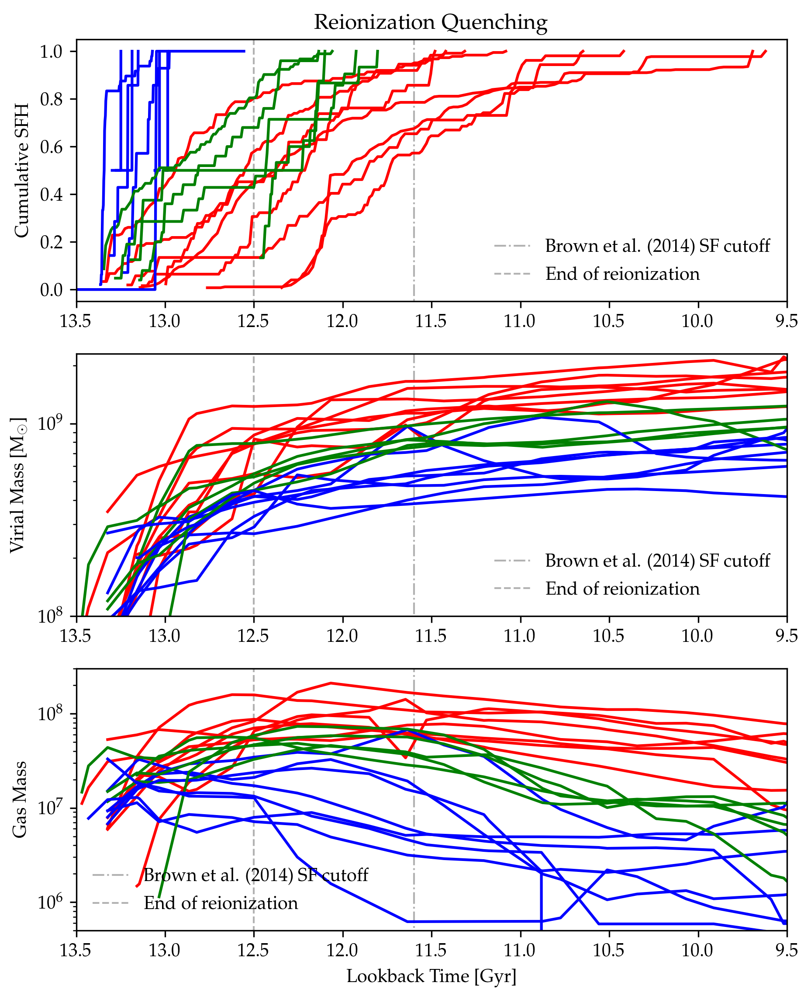

In [241]:
fig, ax = plt.subplots(3,1,figsize=(7,9),dpi=300)

ax[0].plot([11.6,11.6],[-1,2],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')
ax[1].plot([11.6,11.6],[0,1e10],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')
ax[2].plot([11.6,11.6],[0,1e10],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')

ax[0].plot([12.5,12.5],[-1,2],'k--', alpha=0.3,linewidth=1, label='End of reionization')
ax[1].plot([12.5,12.5],[0,1e10],'k--', alpha=0.3,linewidth=1, label='End of reionization')
ax[2].plot([12.5,12.5],[0,1e10],'k--', alpha=0.3,linewidth=1, label='End of reionization')


for tq, c_sfh, bc, time, mvir, mstar,mgas in zip(tquench, c_sfhs, bcs, times, mvirs, mstars, mgass):
    age = 13.800797497330507
    time = age - time
    if tq  > 12.5:
        ax[0].plot(bc,c_sfh,c='b')
        ax[1].plot(time, mvir, c='b')
        ax[2].plot(time, np.array(mgas), c='b')
    elif tq < 11.6:
        ax[0].plot(bc,c_sfh,c='r')
        ax[1].plot(time, mvir, c='r')
        ax[2].plot(time, np.array(mgas), c='r')
    else:
        ax[0].plot(bc,c_sfh,c='g')
        ax[1].plot(time, mvir, c='g')
        ax[2].plot(time, np.array(mgas), c='g')

ax[0].set_xlim(13.5,9.5)
ax[0].set_ylim(-0.05,1.05)
ax[0].set_title('Reionization Quenching')
ax[0].set_ylabel('Cumulative SFH')
ax[0].legend(frameon=False)

ax[1].set_xlim(13.5,9.5)
ax[1].set_ylabel('Virial Mass [$\mathrm{M}_{\odot}$]')
ax[1].semilogy()
ax[1].set_ylim(1e8,2.3e9)
ax[1].legend(frameon=False)

ax[2].set_xlim(13.5,9.5)
ax[2].set_ylim(5e5,3e8)
# ax[2].set_ylabel('$M_* / M_{\mathrm{vir}}$')
ax[2].set_ylabel('Gas Mass')
ax[2].semilogy()
ax[2].legend(frameon=False)
ax[2].set_xlabel('Lookback Time [Gyr]')


plt.show()

h148-90, quenched 11.08 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

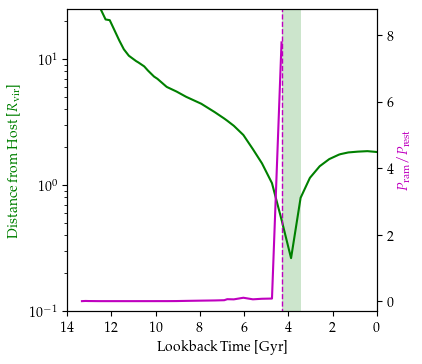

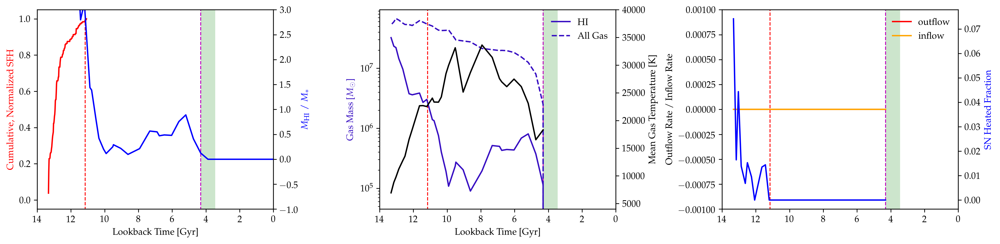

h242-81, quenched 11.42 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

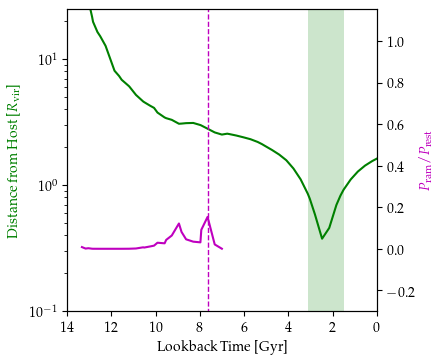

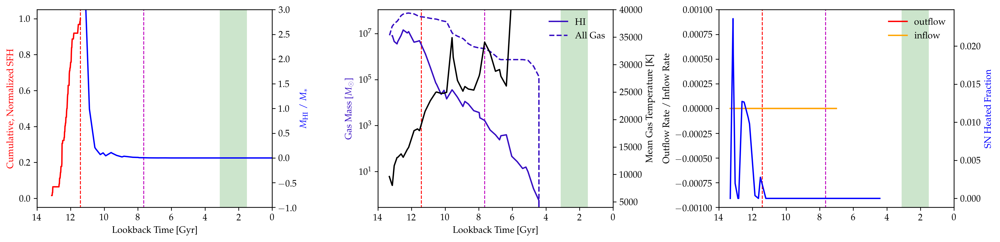

h242-71, quenched 10.65 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

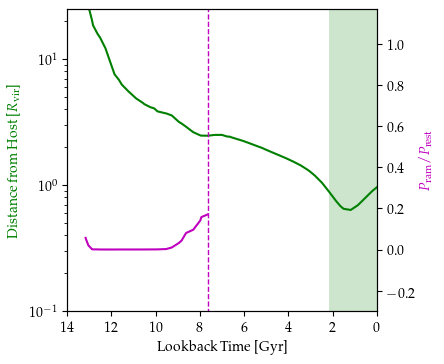

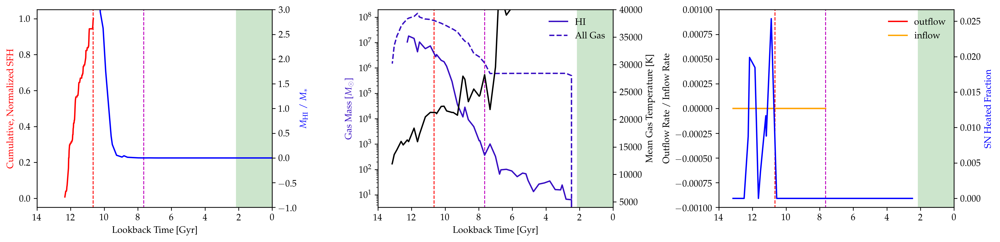

h229-191, quenched 11.31 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

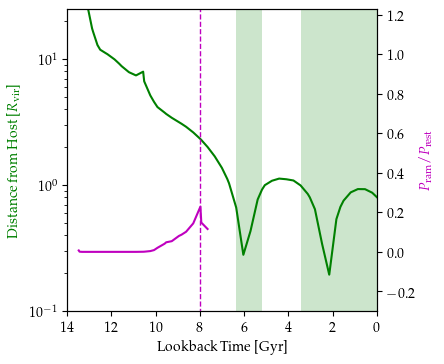

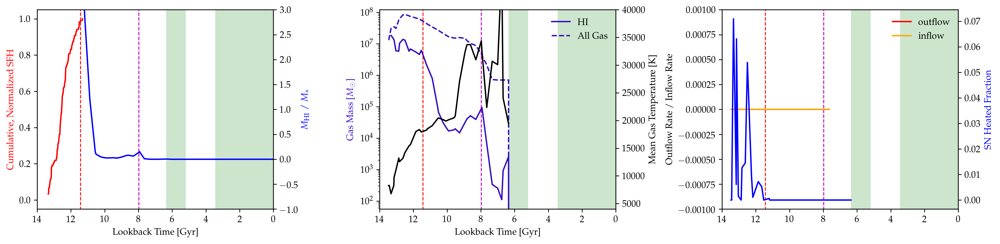

h148-189, quenched 11.48 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

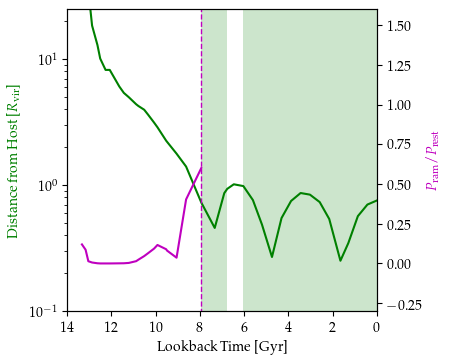

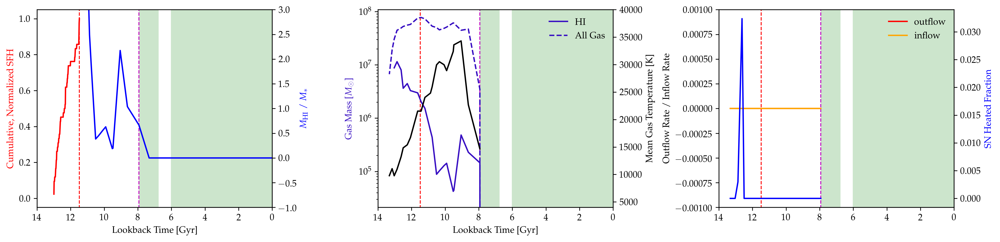

h229-91, quenched 9.69 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

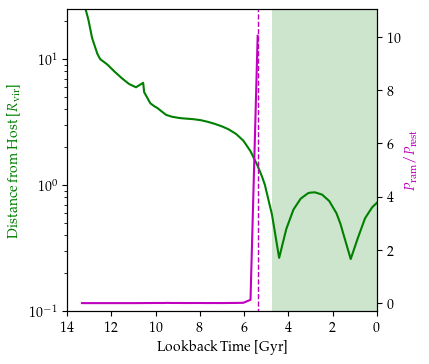

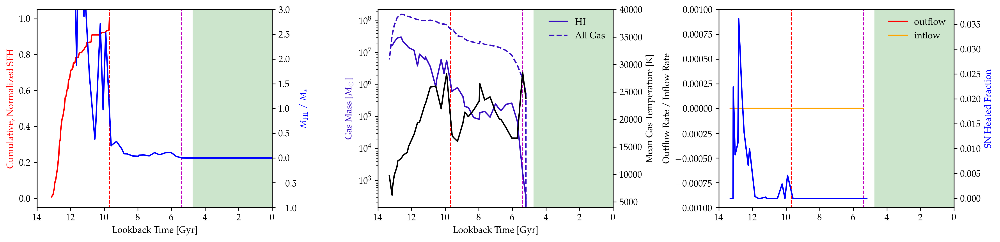

h148-121, quenched 9.62 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

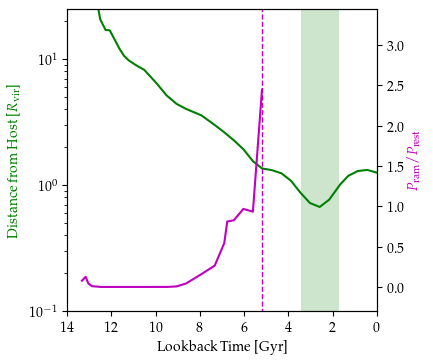

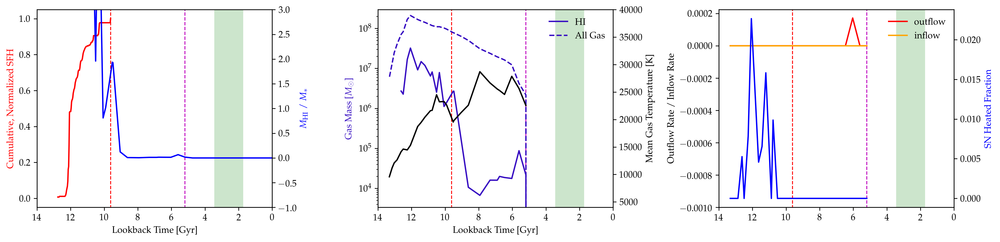

h329-31, quenched 10.42 Gyr ago (red)
Gathering data...


<Figure size 432x288 with 0 Axes>

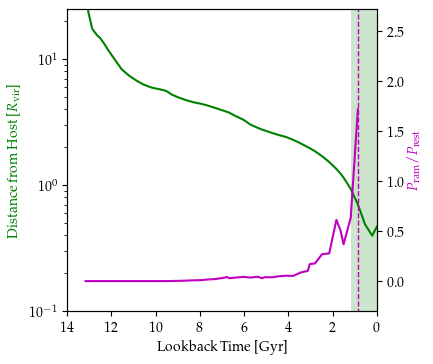

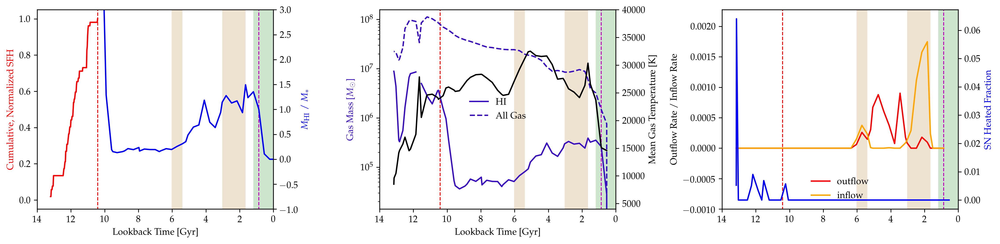

h148-69, quenched 13.19 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

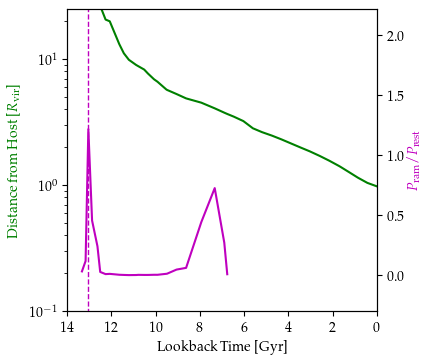

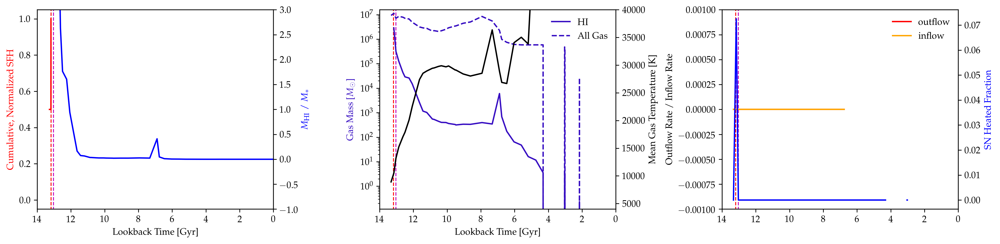

h148-306, quenched 13.03 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

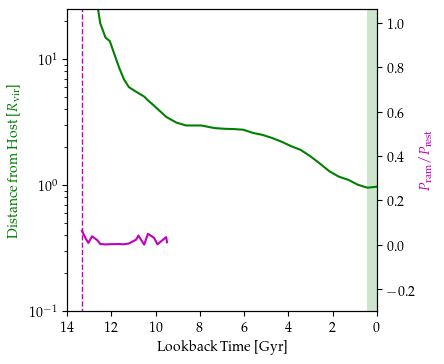

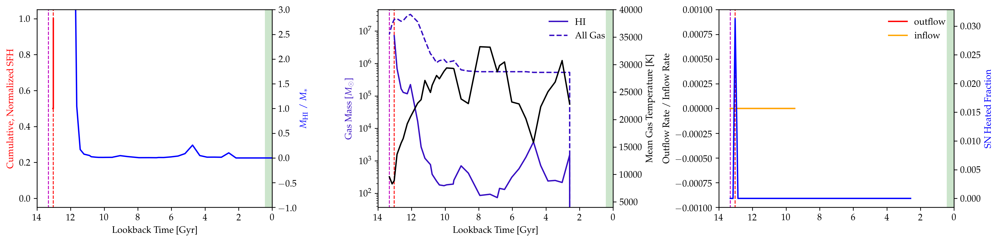

h242-131, quenched 12.98 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

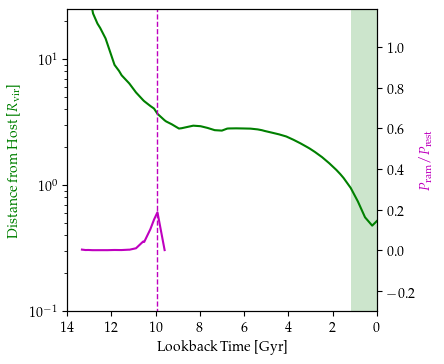

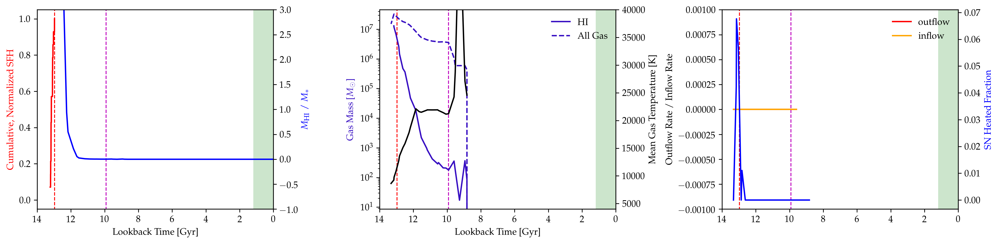

h148-52, quenched 12.98 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

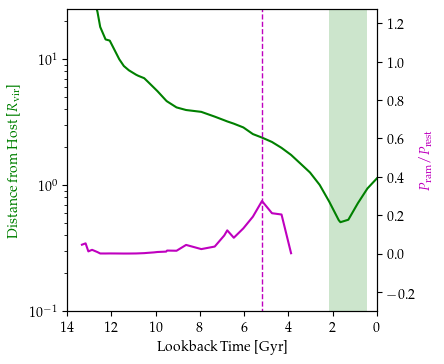

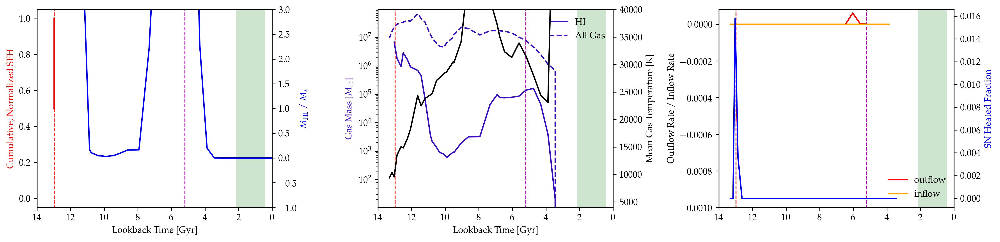

h148-436, quenched 12.10 Gyr ago (green)
Gathering data...


<Figure size 432x288 with 0 Axes>

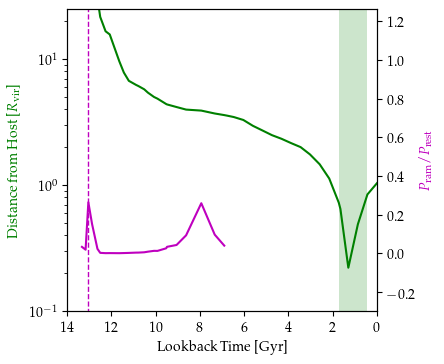

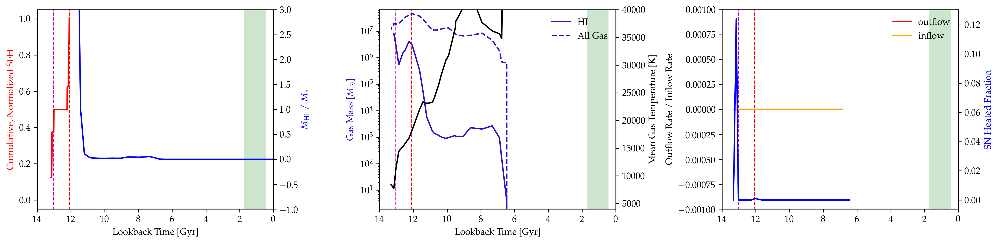

h229-63, quenched 13.25 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

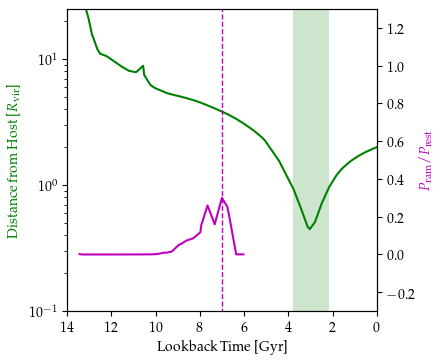

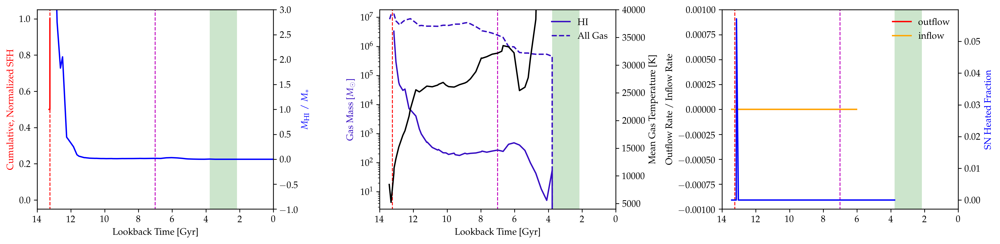

h229-89, quenched 12.56 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

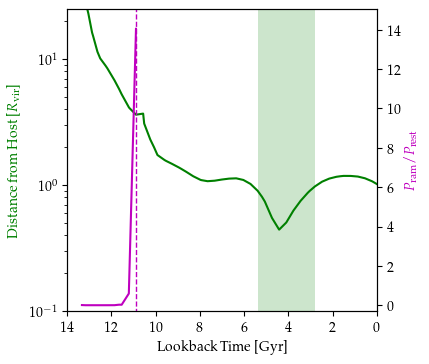

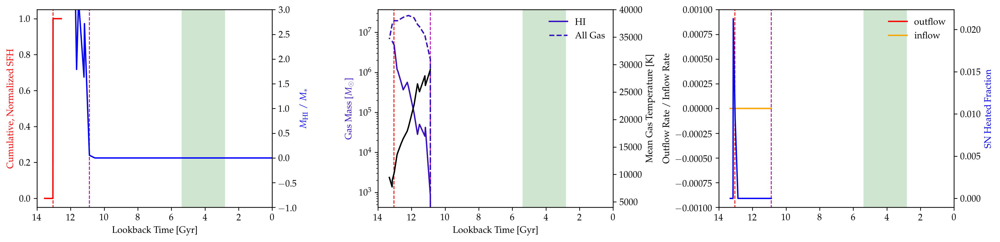

h329-94, quenched 12.14 Gyr ago (green)
Gathering data...


<Figure size 432x288 with 0 Axes>

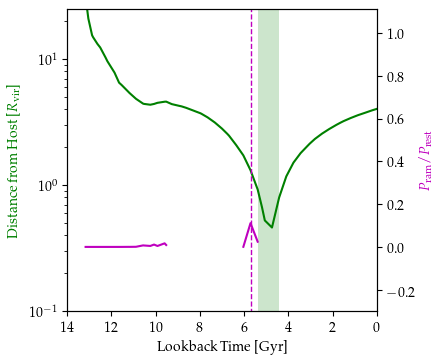

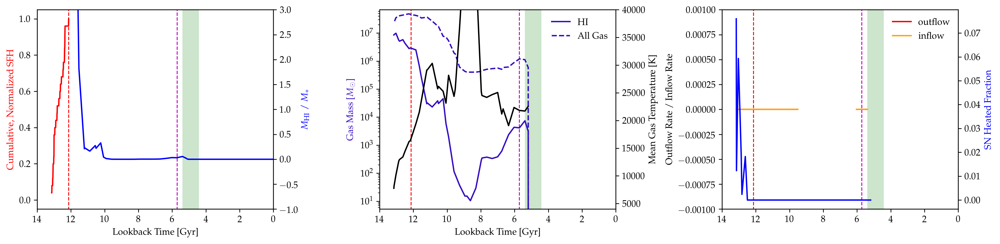

h148-709, quenched 11.92 Gyr ago (green)
Gathering data...


<Figure size 432x288 with 0 Axes>

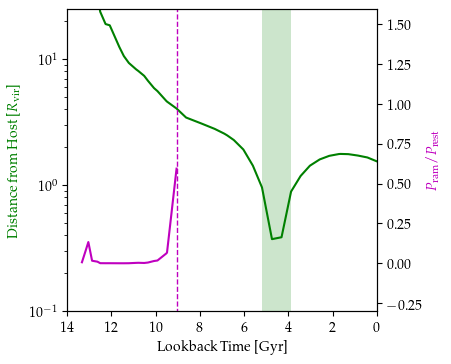

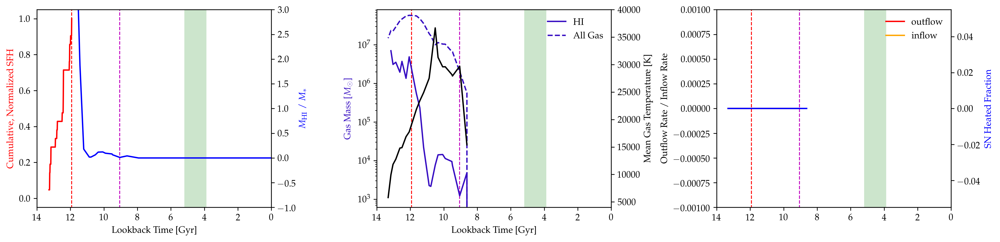

h148-116, quenched 11.80 Gyr ago (green)
Gathering data...


<Figure size 432x288 with 0 Axes>

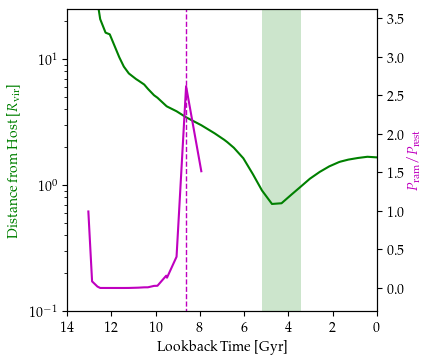

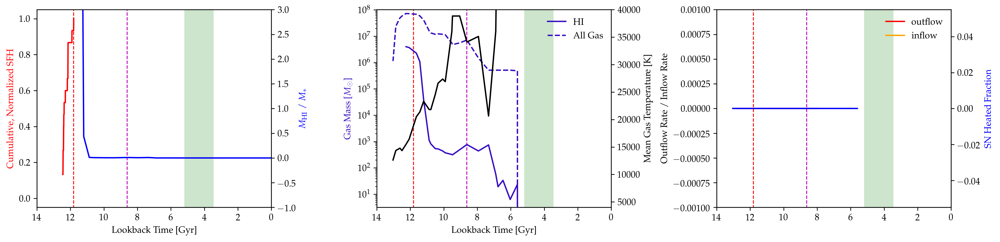

h229-48, quenched 12.06 Gyr ago (green)
Gathering data...


<Figure size 432x288 with 0 Axes>

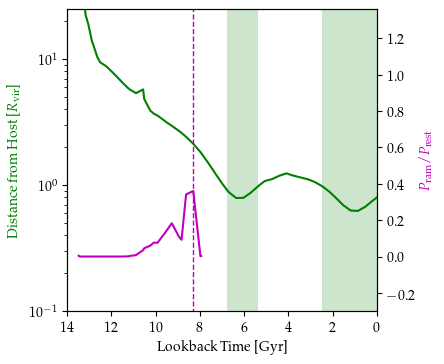

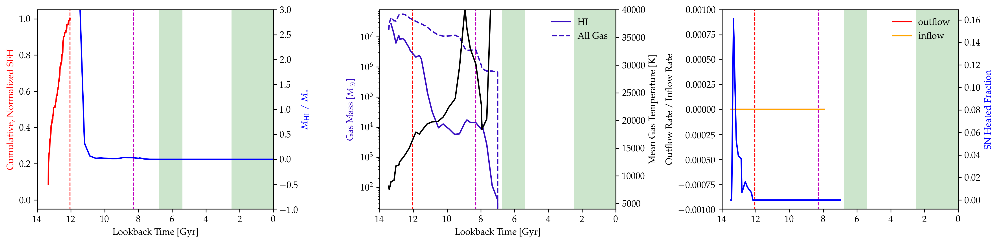

h148-438, quenched 13.07 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

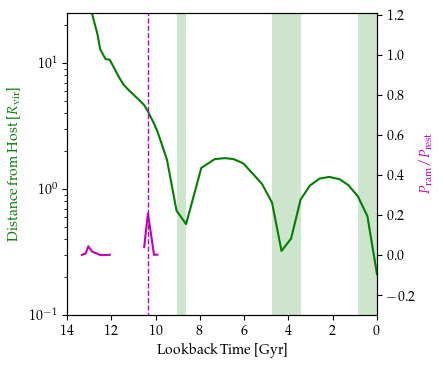

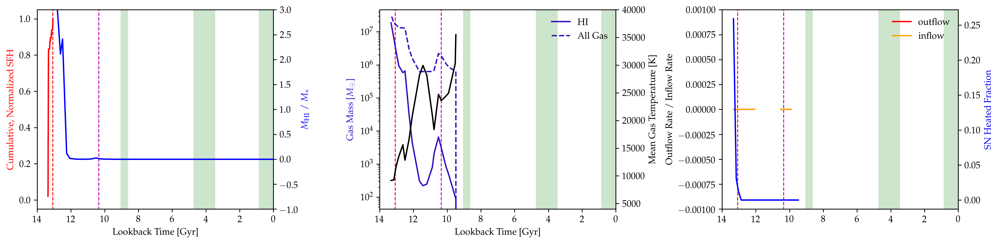

h329-154, quenched 13.15 Gyr ago (blue)
Gathering data...


<Figure size 432x288 with 0 Axes>

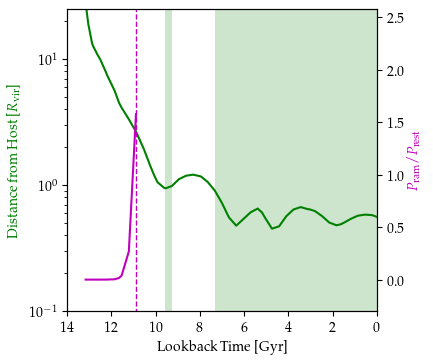

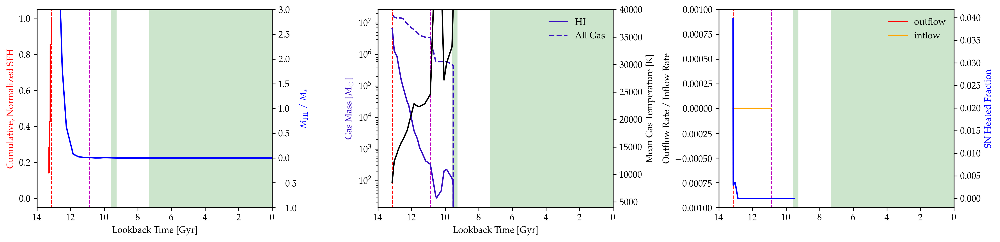

In [247]:
for sim, i, tq in zip(sims,ids,tquench):
    if tq > 12.5:
        flag = 'blue'
    elif tq < 11.6:
        flag = 'red'
    else:
        flag = 'green'
    print(f'{sim}-{i}, quenched {tq:.2f} Gyr ago ({flag})')
    CaseStudyPlots(sim,i)

In [272]:
tquench

[11.082198868440463,
 11.42097288836832,
 10.648194447837033,
 11.313665360166045,
 11.480823171077475,
 9.692965267348548,
 9.621051097424255,
 10.41933880994032,
 13.185659395903008,
 13.031368062555739,
 12.97587460154104,
 12.984999149919801,
 12.100372289413317,
 13.248633297341005,
 12.556216278233595,
 12.13539719501634,
 11.92463915176247,
 11.804051041684557,
 12.059047336579596,
 13.07113780293568,
 13.151410429865358]

In [280]:
qtemps = []
qmvirs = []
qmstars = []
qmHI = []
for sim, i, tq in zip(sims, ids, tquench):
    data = read_file(sim,i)
    time = age - np.array(data.time,dtype=float)
    mvir = np.array(data.mass,dtype=float)
    mstar = np.array(data.mstar,dtype=float)
    gtemp = np.array(data.gtemp,dtype=float)
    gtemp = gtemp[time==np.max(time[time<tq])][0]
    print(f'Quenching time {tq}, temperature {gtemp}')
    qtemps.append(gtemp)
    qmstars.append(mstar[time==np.max(time[time<tq])][0])
    qmvirs.append(mvir[time==np.max(time[time<tq])][0])
    mHI = np.array(data.mHI, dtype=float)
    qmHI.append(mHI[time==np.max(time[time<tq])][0])
    

Quenching time 11.082198868440463, temperature 24043.567993399356
Quenching time 11.42097288836832, temperature 21390.016645367887
Quenching time 10.648194447837033, temperature 21265.09804731198
Quenching time 11.313665360166045, temperature 18287.0091061245
Quenching time 11.480823171077475, temperature 21529.91275735503
Quenching time 9.692965267348548, temperature 17181.90305895099
Quenching time 9.621051097424255, temperature 19539.209754221207
Quenching time 10.41933880994032, temperature 24484.862652705233
Quenching time 13.185659395903008, temperature 10482.62170684199
Quenching time 13.031368062555739, temperature 13668.059403173136
Quenching time 12.97587460154104, temperature 12767.028397405267
Quenching time 12.984999149919801, temperature 13536.105497331673
Quenching time 12.100372289413317, temperature 18313.538933099917
Quenching time 13.248633297341005, temperature 10426.070588943814
Quenching time 12.556216278233595, temperature 16510.438256392594
Quenching time 12.135

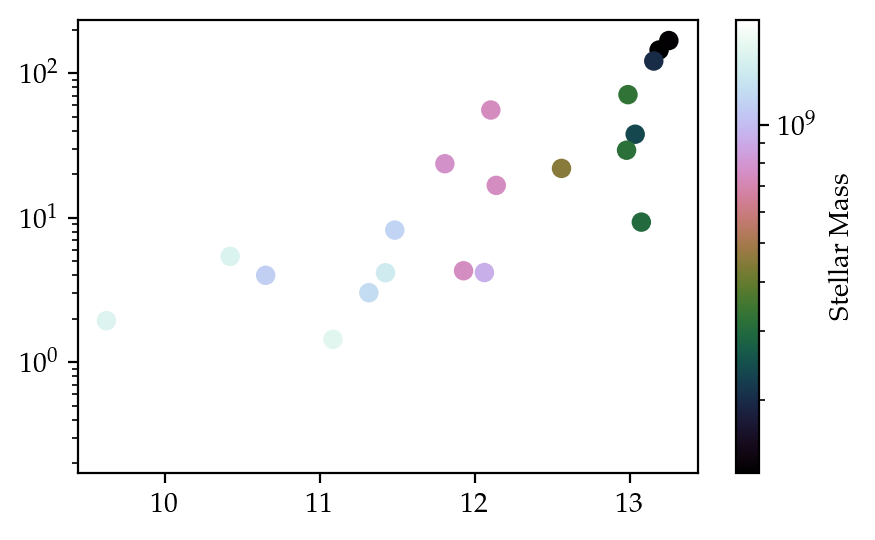

In [283]:
fig, ax = plt.subplots(1,1,figsize=(5,3),dpi=200)
im = ax.scatter(tquench,np.array(qmHI)/np.array(qmstars), c=qmvirs, cmap='cubehelix', norm=mpl.colors.LogNorm())
ax.semilogy()
cbar = plt.colorbar(im, ax = ax) 
cbar.set_label('Stellar Mass')
plt.show()

In [297]:
tquench[(sim=='h229')&(ids==91)]

11.082198868440463

In [310]:
sim = 'h229'
i = 91
data = read_file(sim,i)
c_sfh, bc = cumulative_sfh(sim,i)
tq = np.max(bc[c_sfh > 0.99])
print(tq)

gtemp = np.array(data.gtemp,dtype=float)[data.time < (age-tq)]
density = np.array(data.mgas,dtype=float)[data.time < (age-tq)]/(4/3*np.pi*(np.array(data.Rvir,dtype=float)**3))[data.time < (age-tq)]

9.692965267348548


<Figure size 432x288 with 0 Axes>

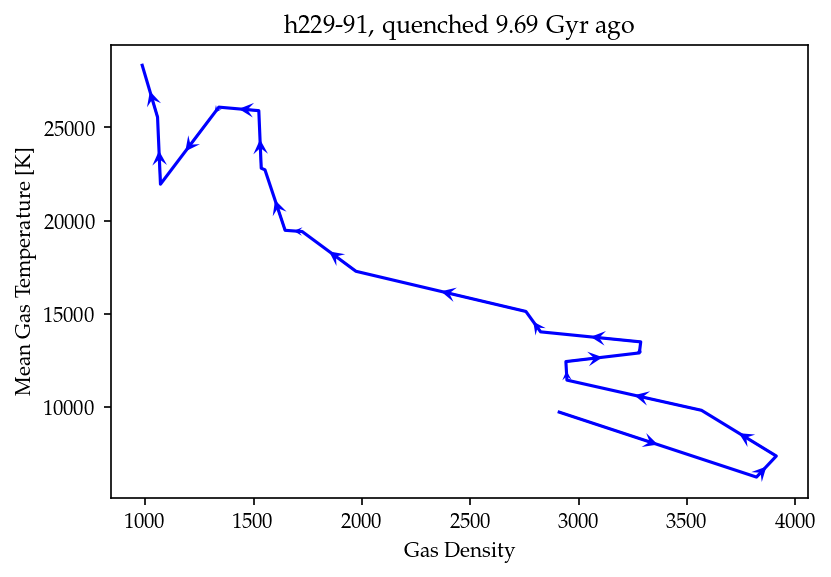

In [362]:

fig, ax = plt.subplots(1,1,dpi=150)
# im = ax.scatter(density, gtemp, c=data.time[data.time < (age-tq)], cmap='cubehelix',s=25,edgecolors='k', linewidths=0.3, zorder=1)

ax.plot(density,gtemp, c='b')
ax.quiver(density[1:],gtemp[1:],(density[:-1]-density[1:])*0.5, (gtemp[:-1]-gtemp[1:])*0.5, 
          scale_units='xy', angles='xy', scale=1, width=0.003, headwidth=7, headlength=7, color='b')

# ax.quiver(density[0],gtemp[0],(density[1]-density[0]),(gtemp[1]-gtemp[0]), scale_units='xy', angles='xy')

# for j, (d, g) in enumerate(zip(density[1:],gtemp[1:])):
#     ax.arrow(d,g,(density[j-1]-d)*0.1,(gtemp[j-1]-g)*0.1, head_width = 70, head_length = 500, zorder=0)
# cbar = fig.colorbar(im, ax=ax)
# cbar.set_label('Time [Gyr]')
ax.set_ylabel('Mean Gas Temperature [K]')
ax.set_xlabel('Gas Density')
plt.title(f'{sim}-{i}, quenched {tq:.2f} Gyr ago')
plt.show()

In [363]:
c_sfhs_phase, bcs_phase, tqs_phase = [],[],[]
for sim, i in zip(['h148', 'h242', 'h242', 'h229', 'h148', 'h229', 'h148', 'h329'],[90, 81, 71, 191, 189, 91, 121, 31]):
    c_sfh, bc = cumulative_sfh(sim,i)
    c_sfhs_phase.append(c_sfh)
    bcs_phase.append(bcs)
    tq = np.max(bc[c_sfh > 0.99])
    print(f'Halo {sim}-{i}, quenchd {tq:.2f} Gyr ago')
    tqs_phase.append(tq)

Halo h148-90, quenchd 11.15 Gyr ago
Halo h242-81, quenchd 11.42 Gyr ago
Halo h242-71, quenchd 10.66 Gyr ago
Halo h229-191, quenchd 11.43 Gyr ago
Halo h148-189, quenchd 11.48 Gyr ago
Halo h229-91, quenchd 9.69 Gyr ago
Halo h148-121, quenchd 9.62 Gyr ago
Halo h329-31, quenchd 10.42 Gyr ago


<Figure size 432x288 with 0 Axes>

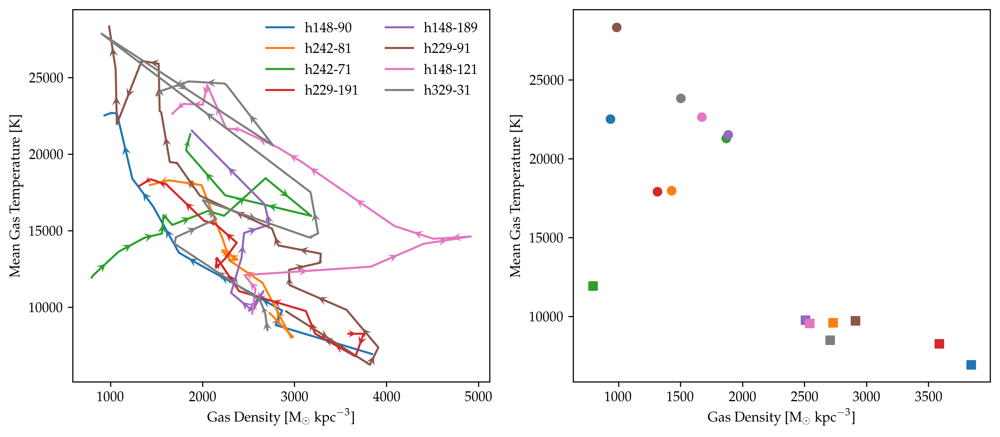

In [371]:
fig, ax = plt.subplots(1,2,figsize=(12,5),dpi=300)

for x, (sim, i, tq) in enumerate(zip(['h148', 'h242', 'h242', 'h229', 'h148', 'h229', 'h148', 'h329'],[90, 81, 71, 191, 189, 91, 121, 31],tqs_phase)):
    data = read_file(sim,i)

    gtemp = np.array(data.gtemp,dtype=float)[data.time < (age-tq)]
    density = np.array(data.mgas,dtype=float)[data.time < (age-tq)]/(4/3*np.pi*(np.array(data.Rvir,dtype=float)**3))[data.time < (age-tq)]
    ax[1].scatter(density[0],gtemp[0],c='C'+str(x), marker='o')
    ax[1].scatter(density[-1],gtemp[-1],c='C'+str(x), marker='s')
    ax[0].plot(density,gtemp, c='C'+str(x), label=f'{sim}-{i}')
    ax[0].quiver(density[1:],gtemp[1:],(density[:-1]-density[1:])*0.5, (gtemp[:-1]-gtemp[1:])*0.5, 
              scale_units='xy', angles='xy', scale=1, width=0.003, headwidth=7, headlength=7, color='C'+str(x))
    
ax[0].set_ylabel('Mean Gas Temperature [K]')
ax[0].set_xlabel('Gas Density [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
ax[1].set_ylabel('Mean Gas Temperature [K]')
ax[1].set_xlabel('Gas Density [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
ax[0].legend(frameon=False,ncol=2)
plt.show()

In [372]:
c_sfhs_phase, bcs_phase, tqs_phase = [],[],[]
sims = ['h148', 'h242', 'h242', 'h229', 'h148', 'h229', 'h148', 'h329','h148', 'h148', 'h242', 'h148', 'h148', 'h229', 'h229', 'h329', 'h148', 'h148', 'h229', 'h148', 'h329']
ids = [90, 81, 71, 191, 189, 91, 121, 31,69, 306, 131, 52, 436, 63, 89, 94, 709, 116, 48, 438, 154]
for sim, i in zip(sims,ids):
    c_sfh, bc = cumulative_sfh(sim,i)
    c_sfhs_phase.append(c_sfh)
    bcs_phase.append(bcs)
    tq = np.max(bc[c_sfh > 0.99])
    print(f'Halo {sim}-{i}, quenchd {tq:.2f} Gyr ago')
    tqs_phase.append(tq)

Halo h148-90, quenchd 11.15 Gyr ago
Halo h242-81, quenchd 11.42 Gyr ago
Halo h242-71, quenchd 10.66 Gyr ago
Halo h229-191, quenchd 11.43 Gyr ago
Halo h148-189, quenchd 11.48 Gyr ago
Halo h229-91, quenchd 9.69 Gyr ago
Halo h148-121, quenchd 9.62 Gyr ago
Halo h329-31, quenchd 10.42 Gyr ago
Halo h148-69, quenchd 13.19 Gyr ago
Halo h148-306, quenchd 13.03 Gyr ago
Halo h242-131, quenchd 12.98 Gyr ago
Halo h148-52, quenchd 12.98 Gyr ago
Halo h148-436, quenchd 12.10 Gyr ago
Halo h229-63, quenchd 13.25 Gyr ago
Halo h229-89, quenchd 13.05 Gyr ago
Halo h329-94, quenchd 12.14 Gyr ago
Halo h148-709, quenchd 11.92 Gyr ago
Halo h148-116, quenchd 11.80 Gyr ago
Halo h229-48, quenchd 12.06 Gyr ago
Halo h148-438, quenchd 13.07 Gyr ago
Halo h329-154, quenchd 13.15 Gyr ago


<Figure size 432x288 with 0 Axes>

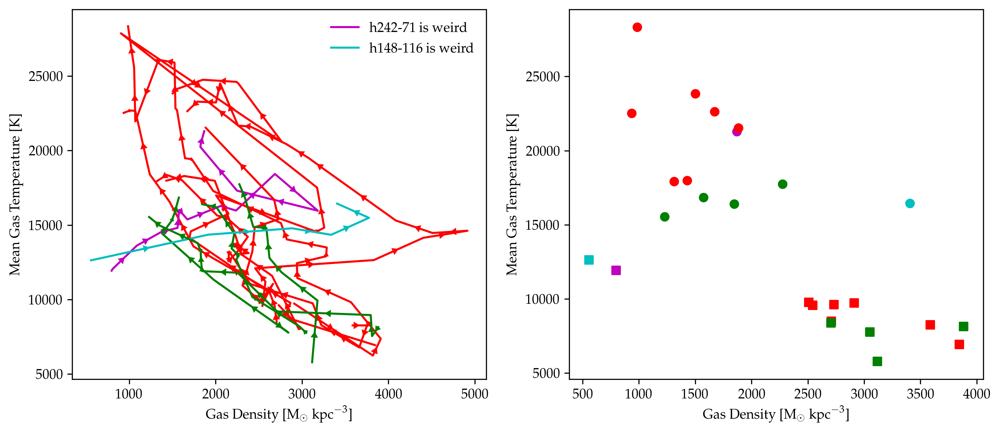

In [381]:
fig, ax = plt.subplots(1,2,figsize=(12,5),dpi=300)
f = 0
colors = ['m','c']
for x, (sim, i, tq) in enumerate(zip(sims,ids,tqs_phase)):
    data = read_file(sim,i)
    if tq > 12.5:
        continue
    elif tq < 11.6:
        color = 'r'
    else:
        color = 'g'

    gtemp = np.array(data.gtemp,dtype=float)[data.time < (age-tq)]
    density = np.array(data.mgas,dtype=float)[data.time < (age-tq)]/(4/3*np.pi*(np.array(data.Rvir,dtype=float)**3))[data.time < (age-tq)]
    
    if density[-1] < 1000:
        color=colors[f]
        f += 1
        label2 = f'{sim}-{i} is weird'
    else: 
        label2 = None
    
    if x==0:
        ax[1].scatter(density[0],gtemp[0],c=color, marker='o', label='End')
        ax[1].scatter(density[-1],gtemp[-1],c=color, marker='s',label='Start')
    else:
        ax[1].scatter(density[0],gtemp[0],c=color, marker='o')
        ax[1].scatter(density[-1],gtemp[-1],c=color, marker='s')
    
    ax[0].plot(density,gtemp, c=color, label=label2)
    ax[0].quiver(density[1:],gtemp[1:],(density[:-1]-density[1:])*0.5, (gtemp[:-1]-gtemp[1:])*0.5, 
              scale_units='xy', angles='xy', scale=1, width=0.003, headwidth=6, headlength=5, color=color, headaxislength=5)


    
ax[0].set_ylabel('Mean Gas Temperature [K]')
ax[0].set_xlabel('Gas Density [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
ax[1].set_ylabel('Mean Gas Temperature [K]')
ax[1].set_xlabel('Gas Density [$\mathrm{M}_{\odot}\ \mathrm{kpc}^{-3}$]')
ax[0].legend(frameon=False)
plt.show()

In [383]:
ages = []
sims = ['h148', 'h242', 'h242', 'h229', 'h148', 'h229', 'h148', 'h329','h148', 'h148', 'h242', 'h148', 'h148', 'h229', 'h229', 'h329', 'h148', 'h148', 'h229', 'h148', 'h329']
ids = [90, 81, 71, 191, 189, 91, 121, 31,69, 306, 131, 52, 436, 63, 89, 94, 709, 116, 48, 438, 154]
for sim, i in zip(sims,ids):
    a = age(sim,i)
    ages.append(a)
    print(f'{sim}-{i}, age {np.mean(a):.2f} ± {np.std(a):.2f}')

h148-90, age 12.76 ± 0.79
h242-81, age 12.24 ± 0.40
h242-71, age 11.61 ± 0.50
h229-191, age 12.51 ± 0.52
h148-189, age 12.34 ± 0.52
h229-91, age 12.07 ± 0.91
h148-121, age 11.66 ± 0.66
h329-31, age 11.82 ± 0.73
h148-69, age 13.22 ± 0.04
h148-306, age 13.01 ± 0.05
h242-131, age 13.12 ± 0.10
h148-52, age 12.98 ± 0.06
h148-436, age 12.63 ± 0.51
h229-63, age 13.24 ± 0.05
h229-89, age 13.07 ± 0.06
h329-94, age 12.72 ± 0.35
h148-709, age 12.59 ± 0.50
h148-116, age 12.25 ± 0.23
h229-48, age 12.91 ± 0.39
h148-438, age 13.31 ± 0.09
h329-154, age 13.23 ± 0.07


In [384]:
len(sims)

21

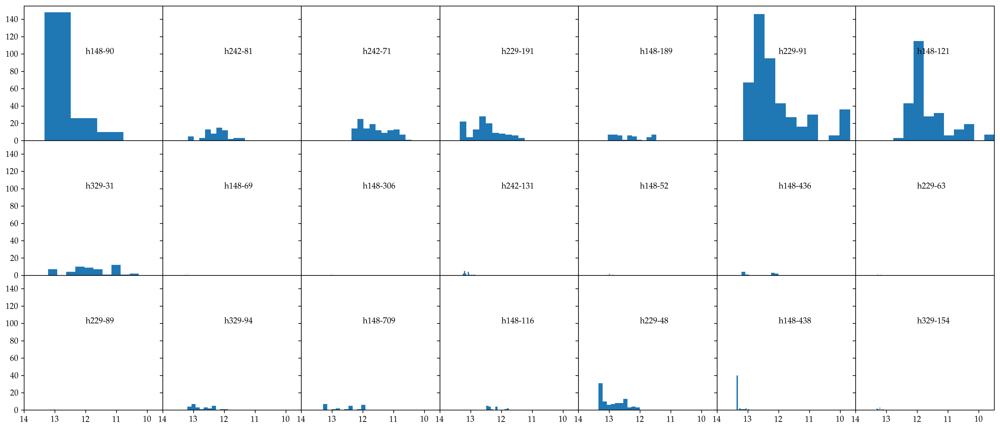

In [399]:
fig, ax = plt.subplots(3,7,figsize=(21,9),sharex=True,sharey=True,dpi=300)

for x, (sim, i, a) in enumerate(zip(sims,ids,ages)):
    if x >= 14:
        ax[2,x-14].hist(a)
        ax[2,x-14].annotate(f'{sim}-{i}',(12,100))
    elif x >= 7:
        ax[1,x-7].hist(a)
        ax[1,x-7].annotate(f'{sim}-{i}',(12,100))
    else:
        ax[0,x].hist(a)
        ax[0,x].annotate(f'{sim}-{i}',(12,100))
        
for v in range(2):
    for w in range(6):
        ax[v,w].set_xlim(14,9.5)
plt.subplots_adjust(wspace=0.,hspace=0.)
plt.show()

12.865437762622053
13.144901603065339
13.033789473731906
12.865437762622879
13.15836973995427
12.865437762622879
13.15836973995427
12.865437762621564


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide
/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in less


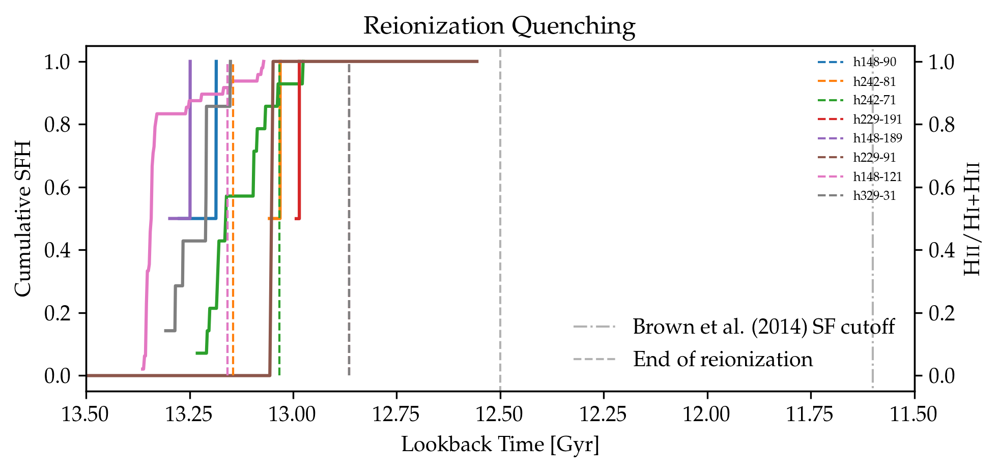

In [204]:
data = []
with open('/home/akinshol/Data/Timescales/reionization.data', 'rb') as f:
    while True:
        try:
            data.append(pickle.load(f,encoding='latin1'))
        except EOFError:
            break

data = pd.DataFrame(data)

fig, ax = plt.subplots(1,1,figsize=(7,3),dpi=300)

ax.plot([11.6,11.6],[-1,2],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')
ax.plot([12.5,12.5],[-1,2],'k--', alpha=0.3,linewidth=1, label='End of reionization')
ax2 = ax.twinx()

c = ['r','g','b','m','k','yellow','orange',]
for x, (c_sfh, bc, sim, i) in enumerate(zip(np.array(c_sfhs)[np.array(tquench) > 12.5], np.array(bcs)[np.array(tquench)>12.5], sims, ids)):
    age = 13.800797497330507
    color = 'C'+str(x)
    
    ax.plot(bc,c_sfh,color=color)
    
    current_data = data[(data.sim==sim)&(data.z0haloid==i)]
    times = age - np.array(current_data.time,dtype=float)
    H2 = np.array(current_data.H2, dtype=float)
    HI = np.array(current_data.HI, dtype=float)
    ratio = H2/(HI+H2)

    if (ratio < 0.6).all():
        print(f'Halo {i} never has H2 frac > 0.6')
    
    newtimes = times[~np.isnan(ratio) & ~np.isinf(ratio)]
    newratio = ratio[~np.isnan(ratio) & ~np.isinf(ratio)]
    tmax = np.max(newtimes[newratio > 0.6])
    print(tmax)
    ax2.plot([tmax,tmax],[0,1],linestyle='--', linewidth=1, color=color, label=f'{sim}-{i}')
#     ax2.plot(times, ratio, linestyle='--',color=color)
    
    
ax.set_xlim(13.5,11.5)
ax2.set_xlim(13.5,11.5)
ax.set_ylim(-0.05,1.05)
ax.set_title('Reionization Quenching')
ax.set_xlabel('Lookback Time [Gyr]')
ax.set_ylabel('Cumulative SFH')
ax2.set_ylabel(r'\textsc{Hii}/\textsc{Hi}+\textsc{Hii}')
ax.legend(frameon=False, loc='lower right')
ax2.legend(frameon=False, loc='upper right', prop={'size':6})

plt.show()
    


/home/akinshol/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide


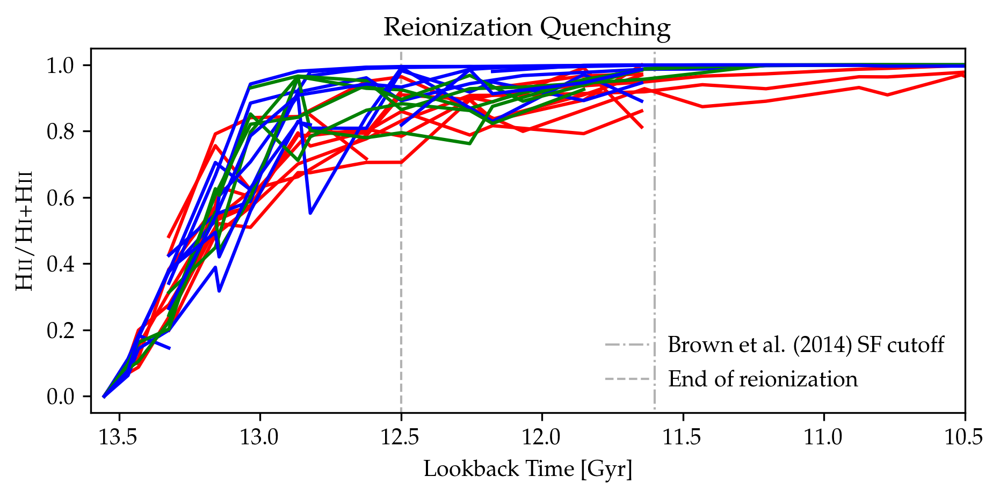

In [210]:
data = []
with open('/home/akinshol/Data/Timescales/reionization.data', 'rb') as f:
    while True:
        try:
            data.append(pickle.load(f,encoding='latin1'))
        except EOFError:
            break

data = pd.DataFrame(data)

fig, ax = plt.subplots(1,1,figsize=(7,3),dpi=300)

ax.plot([11.6,11.6],[-1,2],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')
ax.plot([12.5,12.5],[-1,2],'k--', alpha=0.3,linewidth=1, label='End of reionization')

c = ['r','g','b','m','k','yellow','orange',]
for sim, i, tq in zip(sims,ids,tquench):
    age = 13.800797497330507
    
    current_data = data[(data.sim==sim)&(data.z0haloid==i)]
    times = age - np.array(current_data.time,dtype=float)
    H2 = np.array(current_data.H2, dtype=float)
    HI = np.array(current_data.HI, dtype=float)
    ratio = H2/(HI+H2)
    
    if tq > 12.5:
        c = 'b'
    elif tq < 12.5 and tq > 11.6:
        c = 'g'
    elif tq < 11.6:
        c = 'r'

    ax.plot(times, ratio, linestyle='-',color=c)
    
    
ax.set_xlim(13.6,10.5)

ax.set_ylim(-0.05,1.05)
ax.set_title('Reionization Quenching')
ax.set_xlabel('Lookback Time [Gyr]')

ax.set_ylabel(r'\textsc{Hii}/\textsc{Hi}+\textsc{Hii}')
ax.legend(frameon=False, loc='lower right')

plt.show()
    


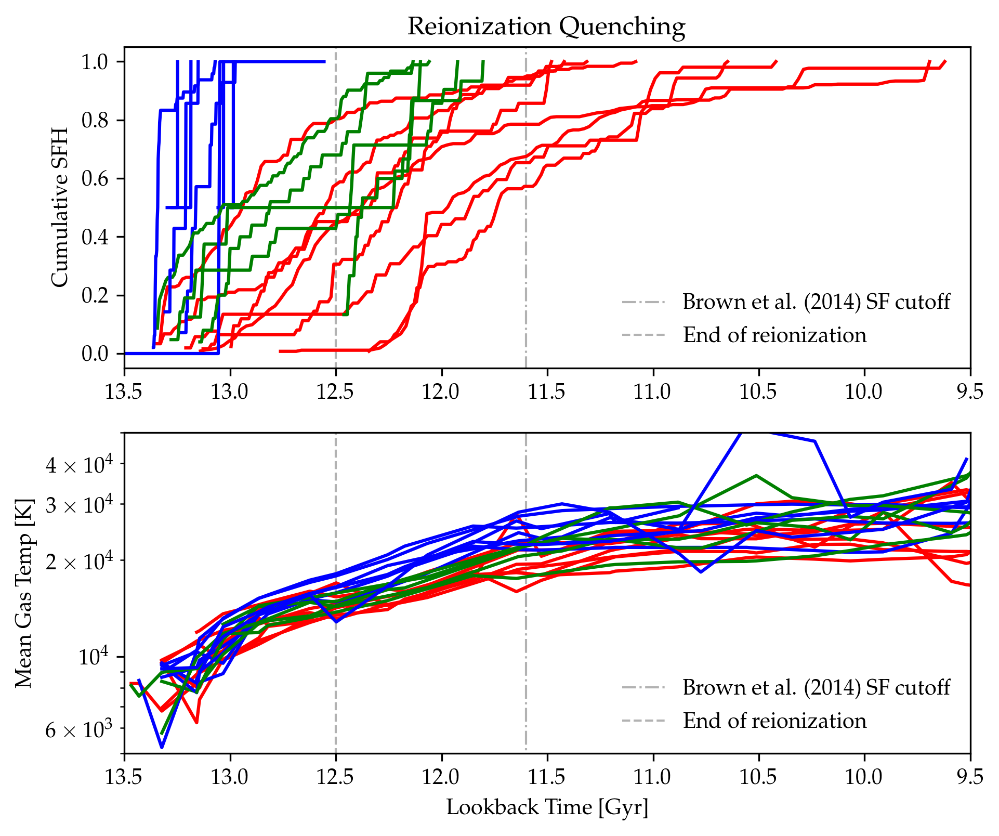

In [86]:
fig, ax = plt.subplots(2,1,figsize=(7,6),dpi=300)

ax[0].plot([11.6,11.6],[-1,2],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')
ax[1].plot([11.6,11.6],[0,1e5],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')

ax[0].plot([12.5,12.5],[-1,2],'k--', alpha=0.3,linewidth=1, label='End of reionization')
ax[1].plot([12.5,12.5],[0,1e5],'k--', alpha=0.3,linewidth=1, label='End of reionization')


for tq, c_sfh, bc, time, mvir in zip(tquench, c_sfhs, bcs, times, gtemps):
    age = 13.800797497330507
    time = age - time
    if tq  > 12.5:
        ax[0].plot(bc,c_sfh,c='b')
        ax[1].plot(time, mvir, c='b')
    elif tq < 11.6:
        ax[0].plot(bc,c_sfh,c='r')
        ax[1].plot(time, mvir, c='r')
    else:
        ax[0].plot(bc,c_sfh,c='g')
        ax[1].plot(time, mvir, c='g')

ax[0].set_xlim(13.5,9.5)
ax[0].set_ylim(-0.05,1.05)
ax[0].set_title('Reionization Quenching')
ax[1].set_xlabel('Lookback Time [Gyr]')
ax[0].set_ylabel('Cumulative SFH')
ax[0].legend(frameon=False)

ax[1].set_xlim(13.5,9.5)
ax[1].semilogy()
ax[1].set_ylim(5e3,5e4)
ax[1].set_xlabel('Lookback Time [Gyr]')
ax[1].set_ylabel('Mean Gas Temp [K]')
ax[1].legend(frameon=False)

plt.show()

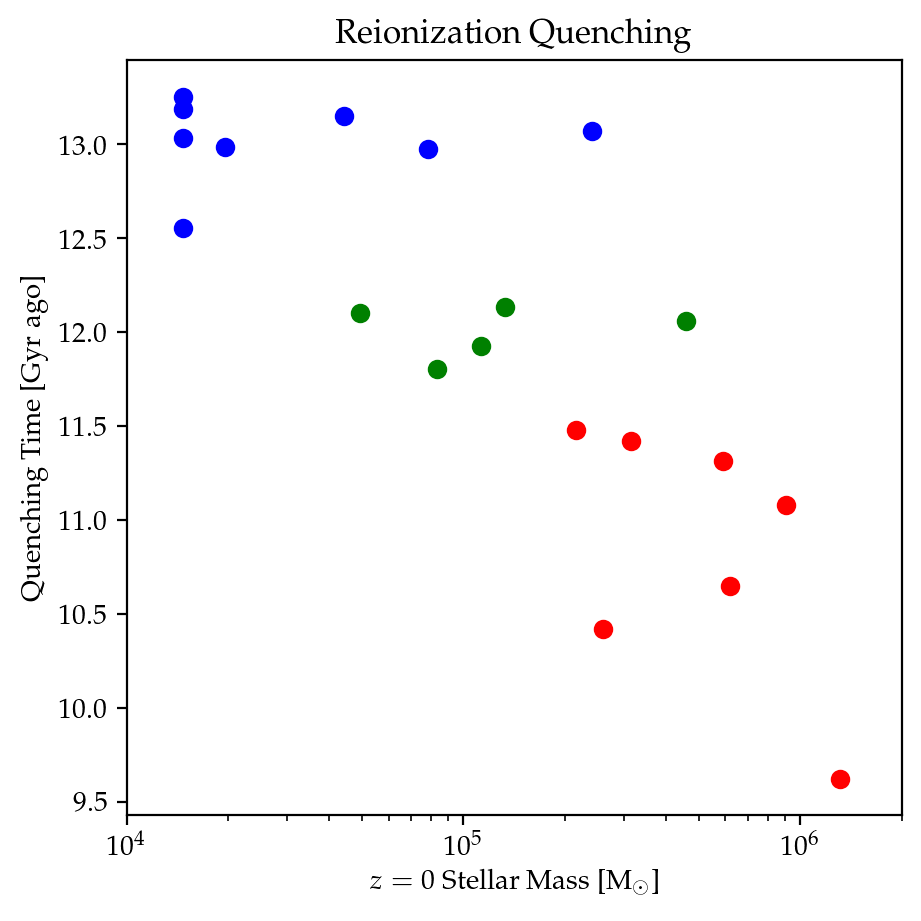

In [51]:
fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=200)
age = 13.800797497330507
for tq, mstar in zip(tquench,mstars):
    if tq  > 12.5:
        ax.scatter([mstar],[tq],c='b')
    elif tq < 11.6:
        ax.scatter([mstar],[tq],c='r')
    else:
        ax.scatter([mstar],[tq],c='g')
        
ax.set_title('Reionization Quenching')
ax.set_xlabel('$z=0$ Stellar Mass [$\mathrm{M}_{\odot}$]')
ax.set_ylabel('Quenching Time [Gyr ago]')
ax.semilogx()
ax.set_xlim(1e4,2e6)

plt.show()

ValueError: x and y must be the same size

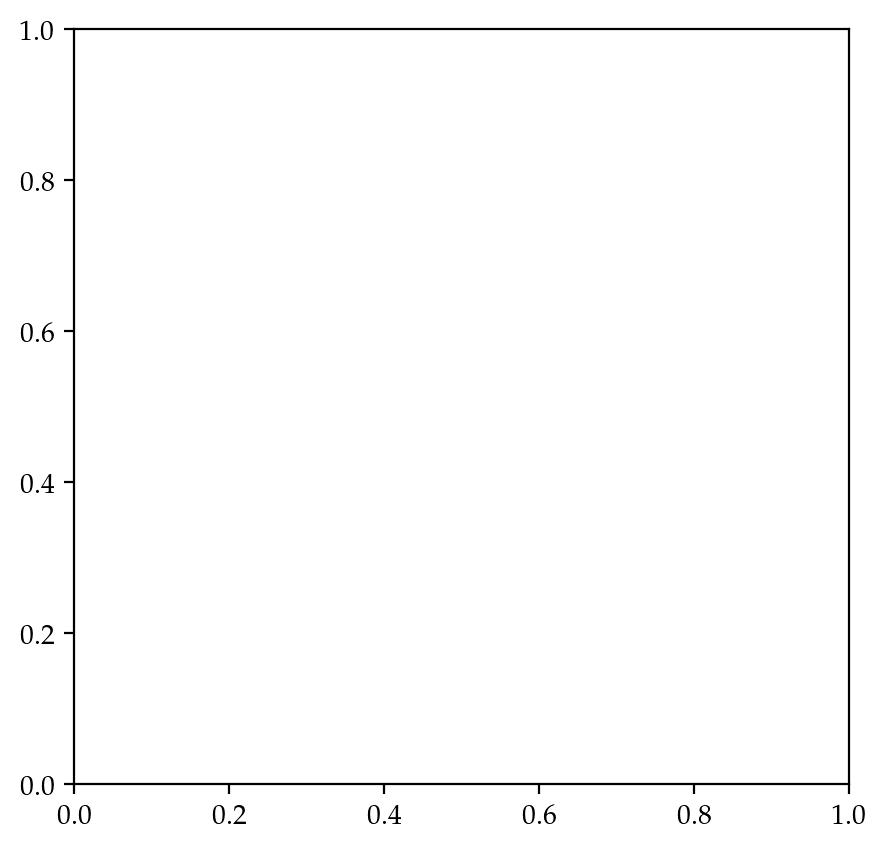

In [214]:
fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=200)
age = 13.800797497330507
for tq, mstar in zip(tquench,mvirs):
    if tq  > 12.5:
        ax.scatter([mstar],[tq],c='b')
    elif tq < 11.6:
        ax.scatter([mstar],[tq],c='r')
    else:
        ax.scatter([mstar],[tq],c='g')
        
ax.set_title('Reionization Quenching')
ax.set_xlabel('$z=0$ Stellar Mass [$\mathrm{M}_{\odot}$]')
ax.set_ylabel('Quenching Time [Gyr ago]')
ax.semilogx()
ax.set_xlim(1e4,2e6)

plt.show()

In [211]:
gtemp_12 = []
gtemp_11 = []
for sim, i, tq in zip(sims,ids,tquench):
    if tq < 12.5:
        # grab mean gas temp at 12.5 Gyr ago
        data = read_file(sim,i)
        times = age-data.time
        snaptime = np.min(times[times > 12.5])
        data = data[times == snaptime]

        gtemp_12.append(data.gtemp.tolist()[0])
        
    if tq < 11.6:
        # grab mean gas temp at 11.6 Gyr ago
        data = read_file(sim,i)
        times = age-data.time
        snaptime = np.min(times[times > 11.6])
        data = data[times == snaptime]

        gtemp_11.append(data.gtemp.tolist()[0])


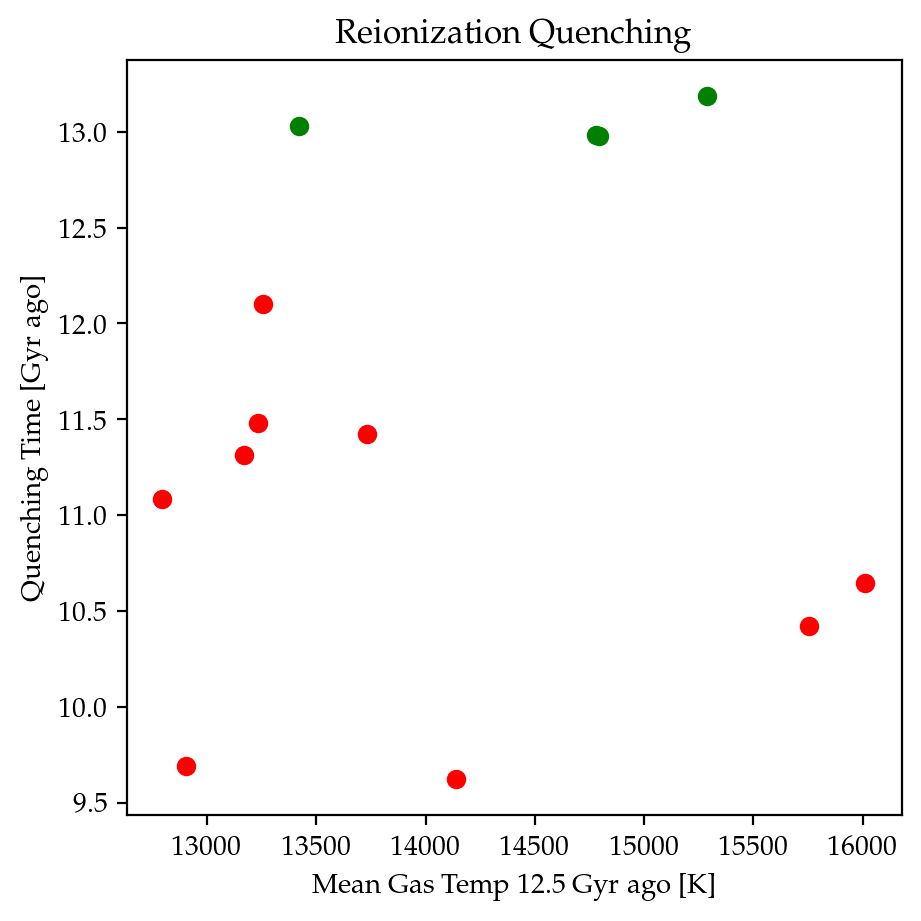

In [61]:
fig, ax = plt.subplots(1,1,figsize=(5,5),dpi=200)
age = 13.800797497330507
for tq, gt in zip(tquench,gtemp_12):
    if tq < 12.5:
        ax.scatter([gt],[tq],c='r')
    else:
        ax.scatter([gt],[tq],c='g')
        
ax.set_title('Reionization Quenching')
ax.set_xlabel('Mean Gas Temp 12.5 Gyr ago [K]')
ax.set_ylabel('Quenching Time [Gyr ago]')
# ax.semilogx()
# ax.set_xlim(1e4,2e6)

plt.show()

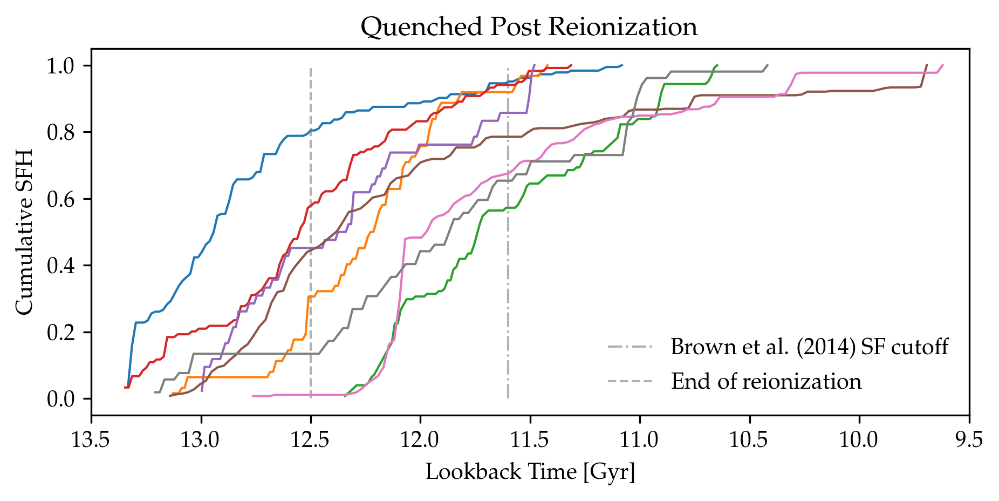

In [14]:
fig, ax = plt.subplots(1,1,figsize=(7,3),dpi=300)

ax.plot([11.6,11.6],[0,1],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')

ax.plot([12.5,12.5],[0,1],'k--', alpha=0.3,linewidth=1, label='End of reionization')


for c_sfh, bc, sim, i in zip(c_sfhs,bcs, sims, ids):
    ax.plot(bc,c_sfh,linewidth=1)


ax.set_xlim(13.5,9.5)
ax.set_title('Quenched Post Reionization')
ax.set_xlabel('Lookback Time [Gyr]')
ax.set_ylabel('Cumulative SFH')
ax.legend(frameon=False)

plt.show()

In [15]:
r_sims = ['h148', 'h148', 'h242', 'h148', 'h148', 'h229', 'h229', 'h329', 'h148', 'h148', 'h229', 'h148', 'h329']
r_ids = [69, 306, 131, 52, 436, 63, 89, 94, 709, 116, 48, 438, 154]

In [16]:
r_c_sfhs, r_bcs =[],[]
for sim, i in zip(r_sims,r_ids):
    print(f'Simulation {sim}, halo {i}')
    c_sfh, bc = cumulative_sfh(sim,i)
    r_c_sfhs.append(c_sfh)
    r_bcs.append(bc)

Simulation h148, halo 69
Simulation h148, halo 306
Simulation h242, halo 131
Simulation h148, halo 52
Simulation h148, halo 436
Simulation h229, halo 63
Simulation h229, halo 89
Simulation h329, halo 94
Simulation h148, halo 709
Simulation h148, halo 116
Simulation h229, halo 48
Simulation h148, halo 438
Simulation h329, halo 154


<Figure size 432x288 with 0 Axes>

In [19]:
r_mstars, r_mvirs = [],[]
for sim, i in zip(r_sims,r_ids):
    data = read_file(sim, i)
    data = data[data.time > 13.6]
    r_mstars.append(data.mstar.tolist()[0])
    r_mvirs.append(data.mass.tolist()[0])
    
mstars, mvirs = [],[]
for sim, i in zip(sims,ids):
    data = read_file(sim, i)
    data = data[data.time > 13.6]
    mstars.append(data.mstar.tolist()[0])
    mvirs.append(data.mass.tolist()[0])

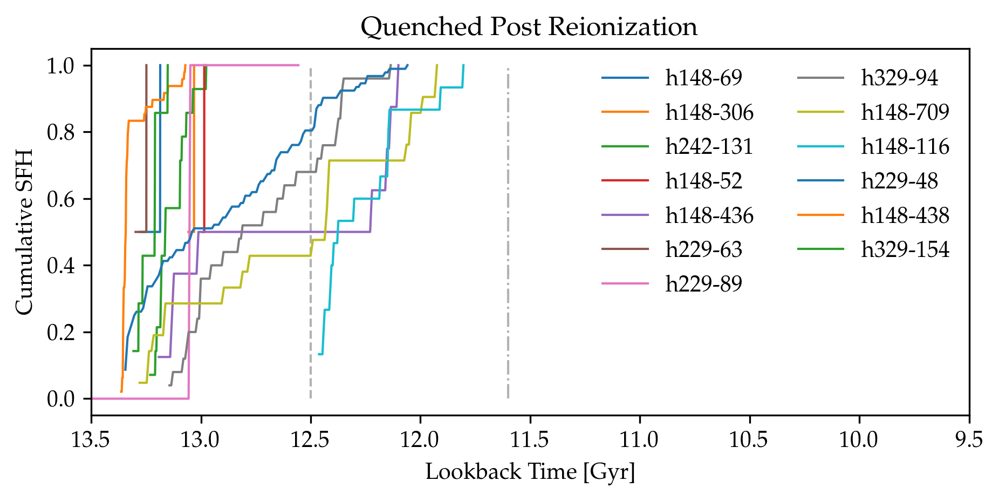

In [34]:
fig, ax = plt.subplots(1,1,figsize=(7,3),dpi=300)

ax.plot([11.6,11.6],[0,1],'k-.', alpha=0.3,linewidth=1, label=None)

ax.plot([12.5,12.5],[0,1],'k--', alpha=0.3,linewidth=1, label=None)


for c_sfh, bc, sim, i in zip(r_c_sfhs,r_bcs, r_sims, r_ids):
    ax.plot(bc,c_sfh,linewidth=1,label=f'{sim}-{i}')


ax.set_xlim(13.5,9.5)
ax.set_title('Quenched Post Reionization')
ax.set_xlabel('Lookback Time [Gyr]')
ax.set_ylabel('Cumulative SFH')
ax.legend(frameon=False, ncol=2)

plt.show()

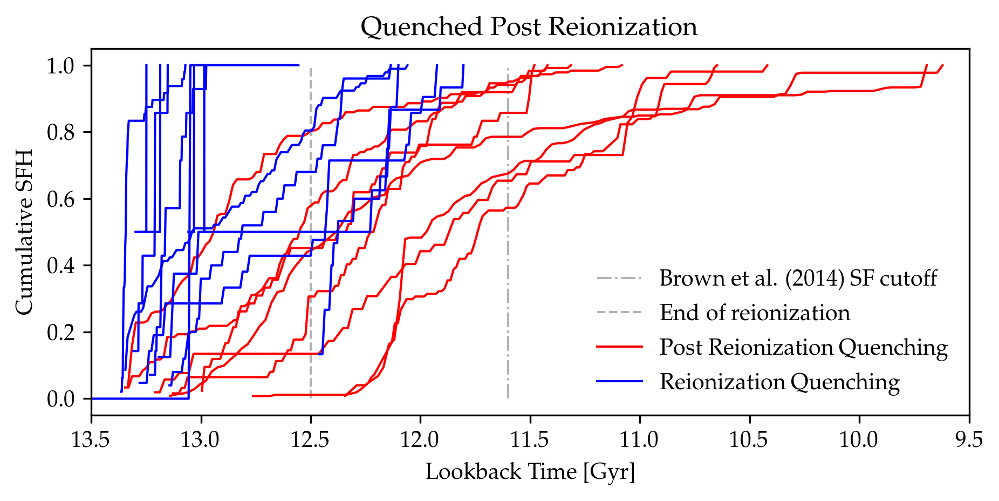

In [23]:
fig, ax = plt.subplots(1,1,figsize=(7,3),dpi=300)

ax.plot([11.6,11.6],[0,1],'k-.', alpha=0.3,linewidth=1, label='Brown et al. (2014) SF cutoff')

ax.plot([12.5,12.5],[0,1],'k--', alpha=0.3,linewidth=1, label='End of reionization')


for x, (c_sfh, bc, sim, i) in enumerate(zip(c_sfhs,bcs, sims, ids)):
    if x==0:
        l = 'Post Reionization Quenching'
    else:
        l = None
    ax.plot(bc,c_sfh,linewidth=1,c='r', label=l)
    
for x, (c_sfh, bc, sim, i) in enumerate(zip(r_c_sfhs, r_bcs, r_sims, r_ids)):
    if x==0:
        l = 'Reionization Quenching'
    else:
        l = None
    ax.plot(bc,c_sfh,linewidth=1,c='b', label=l)


ax.set_xlim(13.5,9.5)
ax.set_title('Quenched Post Reionization')
ax.set_xlabel('Lookback Time [Gyr]')
ax.set_ylabel('Cumulative SFH')
ax.legend(frameon=False)

plt.show()

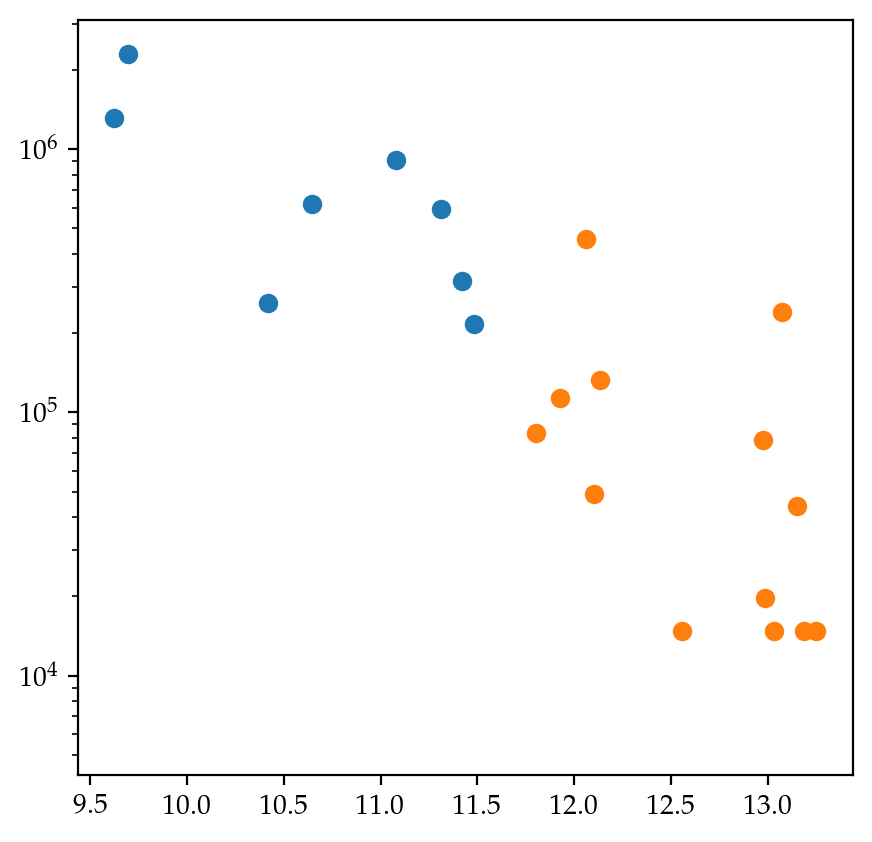

In [32]:
tquench = []
r_tquench = []
for bc in bcs:
    tquench.append(bc[-1])

for bc in r_bcs:
    r_tquench.append(bc[-1])
    
plt.figure(figsize=(5,5),dpi=200)
plt.scatter(tquench,mstars)
plt.scatter(r_tquench,r_mstars)
plt.semilogy()
plt.show()
    

In [132]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000071')
s.physical_units()
h = s.halos()

In [134]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

15.93297883547153 	 1.5772051133147762e-05


In [135]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000107')
s.physical_units()
h = s.halos()

In [136]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

11.991963417952283 	 4.20241327017087e-09


In [137]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000188')
s.physical_units()
h = s.halos()

In [138]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

7.986497519608237 	 0.00043292921529242617


In [139]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000192')
s.physical_units()
h = s.halos()

In [140]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

7.862925080195625 	 0.0044897940305692816


In [141]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000225')
s.physical_units()
h = s.halos()

In [142]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

6.98380804761998 	 0.007275794270915887


In [143]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000275')
s.physical_units()
h = s.halos()

In [144]:
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

5.992850970573559 	 0.003740798544914977


In [145]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000384')
s.physical_units()
h = s.halos()

In [146]:
i = 29
H2 = np.sum(h[1].g['mass']*h[1].g['H2'])/np.sum(h[1].g['mass'])
HI = np.sum(h[1].g['mass']*h[1].g['HI'])/np.sum(h[1].g['mass'])
print(s.properties['z'], '\t', H2/HI)

4.604307687944998 	 0.009604508430531032


In [133]:
h[1].g['HII']

SimArray([0.02214461, 0.00185564, 0.00382599, ..., 0.01193086, 0.0067519 ,
          0.00669009])

In [126]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
hifrac = np.sum(h[1].g['mass']*h[1].g['hydrogen'])/np.sum(h[1].g['mass'])
print(ionfrac,hifrac)
print(s.properties['z'],ionfrac/hifrac)

0.001248546077329994 0.7637620291449665
15.93297883547153 0.001634731800856537


In [127]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000107')
s.physical_units()
h = s.halos()

In [128]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
hifrac = np.sum(h[1].g['mass']*h[1].g['hydrogen'])/np.sum(h[1].g['mass'])
print(ionfrac,hifrac)
print(s.properties['z'],ionfrac/hifrac)

1.9559789056882114e-07 0.7639175650127525
11.991963417952283 2.5604580851018383e-07


In [105]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000188')
s.physical_units()
h = s.halos()

In [106]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

7.986497519608237 0.0018842757282265155


In [107]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000192')
s.physical_units()
h = s.halos()

In [108]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

7.862925080195625 0.0008500812374898096


In [109]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000225')
s.physical_units()
h = s.halos()

In [110]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

6.98380804761998 0.001867689261694164


In [111]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000275')
s.physical_units()
h = s.halos()

In [112]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

5.992850970573559 0.001965134841328578


In [113]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.000288')
s.physical_units()
h = s.halos()

In [114]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

5.782387457807092 0.0014972381464769327


In [115]:
s = pynbody.load('/home/christenc/Data/Sims/h329.cosmo50PLK.3072g/h329.cosmo50PLK.3072gst5HbwK1BH/snapshots/h329.cosmo50PLK.3072gst5HbwK1BH.001475')
s.physical_units()
h = s.halos()

In [116]:
ionfracs = pynbody.analysis.ionfrac.calculate(h[1])
ionfrac = np.sum(h[1].g['mass']*ionfracs)/np.sum(h[1].g['mass'])
print(s.properties['z'],ionfrac)

1.2499538959997887 0.01320369798291105


In [155]:
h69_ids = [48, 47, 46, 44, 45, 42, 42, 43, 44, 40, 42, 43, 42, 43, 44, 45, 44, 43, 41, 39, 41, 41, 41, 
           42, 40, 40, 38, 40, 41, 40, 40, 38, 40, 39, 41, 41, 41, 45, 43, 43, 43, 46, 47, 48, 51, 52, 57, 
           61, 59, 63, 67, 67, 65, 57, 58, 81, 74, 71, 34, 30, 47]

snapshots = ['h229.cosmo50PLK.3072gst5HbwK1BH.004096', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.004032', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003936', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003840', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003744', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003648', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003606', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003552', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003456', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003360', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003264', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003195', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003168', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.003072',
             'h229.cosmo50PLK.3072gst5HbwK1BH.002976', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002880', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002784', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002688', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002592', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002554', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002496', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002400', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002304',
             'h229.cosmo50PLK.3072gst5HbwK1BH.002208', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002112', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002088', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.002016', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001920', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001824',
             'h229.cosmo50PLK.3072gst5HbwK1BH.001740',
             'h229.cosmo50PLK.3072gst5HbwK1BH.001728',
             'h229.cosmo50PLK.3072gst5HbwK1BH.001632', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001536', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001475', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001440', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001344', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001269', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001248',
             'h229.cosmo50PLK.3072gst5HbwK1BH.001152', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001106', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.001056', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000974', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000960',
             'h229.cosmo50PLK.3072gst5HbwK1BH.000864', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000776', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000768', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000672', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000637', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000576', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000480', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000456', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000384', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000347', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000288', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000275', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000225', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000192', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000188', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000139', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000107', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000096', 
             'h229.cosmo50PLK.3072gst5HbwK1BH.000071']

In [173]:
print(len(h69_ids))
print(len(snapshots[:len(h69_ids)]))

61
61


In [161]:
times, HIs, H2s = [],[],[]

for snapshot, hid in zip(np.flip(snapshots[-15:-1]), np.flip(h69_ids[-14:])):
#     s = pynbody.load('/home/christenc/Data/Sims/h148.cosmo50PLK.3072g/h148.cosmo50PLK.3072g3HbwK1BH/snapshots/')
    s = pynbody.load('/home/christenc/Data/Sims/h229.cosmo50PLK.3072g/h229.cosmo50PLK.3072gst5HbwK1BH/snapshots/'+snapshot)
    s.physical_units()
    h = s.halos()
    print(f'Loaded snapshot {snapshot}')
    
    halo = h[hid]
    time = s.properties['time'].in_units('Gyr')
    H2 = np.sum(halo.g['mass']*halo.g['HII'])/np.sum(halo.g['mass'])
    HI = np.sum(halo.g['mass']*halo.g['HI'])/np.sum(halo.g['mass'])
    print(f'H2/HI {H2/HI:.2e}')
    HIs.append(HI)
    H2s.append(H2)
    times.append(time)

Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000096
H2/HI 7.86e-02
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000107
H2/HI 1.02e-01
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000139
H2/HI 2.42e-01
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000188
H2/HI 1.02e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000192
H2/HI 1.25e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000225
H2/HI 3.11e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000275
H2/HI 2.58e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000288
H2/HI 4.05e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000347
H2/HI 3.98e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000384
H2/HI 4.71e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000456
H2/HI 6.66e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000480
H2/HI 8.12e+00
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000576
H2/HI 1.07e+01
Loaded snapshot h229.cosmo50PLK.3072gst5HbwK1BH.000637
H2/HI 8.13e+00


In [165]:
c_sfh, bc, sfhmstar = cumulative_sfh('h229',48)

<Figure size 432x288 with 0 Axes>

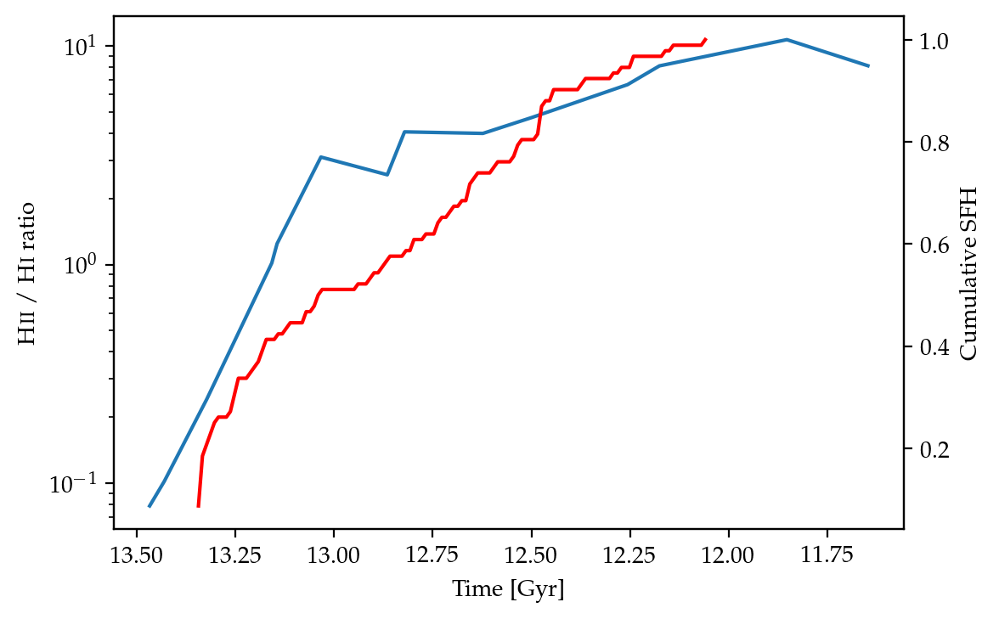

In [171]:
age = 13.800797497330507
fig, ax = plt.subplots(1,1,figsize=(6,4),dpi=200)
ax.plot(age - np.array(times), np.array(H2s)/np.array(HIs))
ax2 = ax.twinx()
ax2.plot(bc, c_sfh, c='r')
ax2.set_ylabel('Cumulative SFH')
ax.set_xlabel('Time [Gyr]')
ax.set_ylabel(r'\textsc{Hii} / \textsc{Hi} ratio')
ax.semilogy()
ax.invert_xaxis()
ax2.invert_xaxis()

plt.show()